![image](https://user-images.githubusercontent.com/57321948/196933065-4b16c235-f3b9-4391-9cfe-4affcec87c35.png)

# **Class - 72 `Deep Learning`**
## **19 February 2023**

# CNN Architectures

## LeNet

### Basic Introduction

LeNet-5, from the paper Gradient-Based Learning Applied to Document Recognition, is a very efficient convolutional neural network for handwritten character recognition.


<a href="http://yann.lecun.com/exdb/publis/pdf/lecun-98.pdf" target="_blank">Paper: <u>Gradient-Based Learning Applied to Document Recognition</u></a>

**Authors**: Yann LeCun, Léon Bottou, Yoshua Bengio, and Patrick Haffner

**Published in**: Proceedings of the IEEE (1998)

### Structure of the LeNet network

LeNet5 is a small network, it contains the basic modules of deep learning: convolutional layer, pooling layer, and full link layer. It is the basis of other deep learning models. Here we analyze LeNet5 in depth. At the same time, through example analysis, deepen the understanding of the convolutional layer and pooling layer.

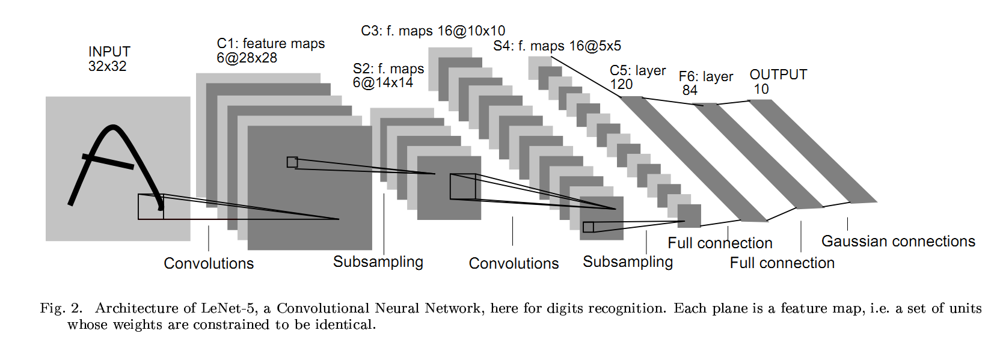


LeNet-5 Total seven layer , does not comprise an input, each containing a trainable parameters; each layer has a plurality of the Map the Feature , a characteristic of each of the input FeatureMap extracted by means of a convolution filter, and then each FeatureMap There are multiple neurons.

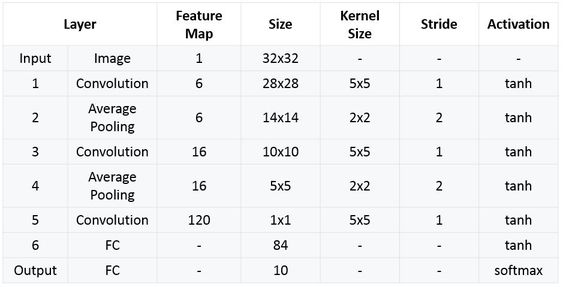

Detailed explanation of each layer parameter:

#### **INPUT Layer**

The first is the data INPUT layer. The size of the input image is uniformly normalized to 32 * 32.

> Note: This layer does not count as the network structure of LeNet-5. Traditionally, the input layer is not considered as one of the network hierarchy.


#### **C1 layer-convolutional layer**

>**Input picture**: 32 * 32

>**Convolution kernel size**: 5 * 5

>**Convolution kernel types**: 6

>**Output featuremap size**: 28 * 28 (32-5 + 1) = 28

>**Number of neurons**: 28 * 28 * 6

>**Trainable parameters**: (5 * 5 + 1) * 6 (5 * 5 = 25 unit parameters and one bias parameter per filter, a total of 6 filters)

>**Number of connections**: (5 * 5 + 1) * 6 * 28 * 28 = 122304

**Detailed description:** 

1. The first convolution operation is performed on the input image (using 6 convolution kernels of size 5 * 5) to obtain 6 C1 feature maps (6 feature maps of size 28 * 28, 32-5 + 1 = 28). 

2. Let's take a look at how many parameters are needed. The size of the convolution kernel is 5 * 5, and there are 6 * (5 * 5 + 1) = 156 parameters in total, where +1 indicates that a kernel has a bias. 

3. For the convolutional layer C1, each pixel in C1 is connected to 5 * 5 pixels and 1 bias in the input image, so there are 156 * 28 * 28 = 122304 connections in total. There are 122,304 connections, but we only need to learn 156 parameters, mainly through weight sharing.


#### **S2 layer-pooling layer (downsampling layer)**

>**Input**: 28 * 28

>**Sampling area**: 2 * 2

>**Sampling method**: 4 inputs are added, multiplied by a trainable parameter, plus a trainable offset. Results via sigmoid

>**Sampling type**: 6

>**Output featureMap size**: 14 * 14 (28/2)

>**Number of neurons**: 14 * 14 * 6

>**Trainable parameters**: 2 * 6 (the weight of the sum + the offset)

>**Number of connections**: (2 * 2 + 1) * 6 * 14 * 14

>The size of each feature map in S2 is 1/4 of the size of the feature map in C1.

**Detailed description:** 

The pooling operation is followed immediately after the first convolution. Pooling is performed using 2 * 2 kernels, and S2, 6 feature maps of 14 * 14 (28/2 = 14) are obtained. 

The pooling layer of S2 is the sum of the pixels in the 2 * 2 area in C1 multiplied by a weight coefficient plus an offset, and then the result is mapped again. 

So each pooling core has two training parameters, so there are 2x6 = 12 training parameters, but there are 5x14x14x6 = 5880 connections.

#### **C3 layer-convolutional layer**

>**Input**: all 6 or several feature map combinations in S2

>**Convolution kernel size**: 5 * 5

>**Convolution kernel type**: 16

>**Output featureMap size**: 10 * 10 (14-5 + 1) = 10

>Each feature map in C3 is connected to all 6 or several feature maps in S2, indicating that the feature map of this layer is a different combination of the feature maps extracted from the previous layer.

>One way is that the first 6 feature maps of C3 take 3 adjacent feature map subsets in S2 as input. The next 6 feature maps take 4 subsets of neighboring feature maps in S2 as input. The next three take the non-adjacent 4 feature map subsets as input. The last one takes all the feature maps in S2 as input.

>**The trainable parameters are**: 6 * (3 * 5 * 5 + 1) + 6 * (4 * 5 * 5 + 1) + 3 * (4 * 5 * 5 + 1) + 1 * (6 * 5 * 5 +1) = 1516

>**Number of connections**: 10 * 10 * 1516 = 151600

**Detailed description:** 

After the first pooling, the second convolution, the output of the second convolution is C3, 16 10x10 feature maps, and the size of the convolution kernel is 5 * 5. We know that S2 has 6 14 * 14 feature maps, how to get 16 feature maps from 6 feature maps? Here are the 16 feature maps calculated by the special combination of the feature maps of S2. details as follows:


The first 6 feature maps of C3 (corresponding to the 6th column of the first red box in the figure above) are connected to the 3 feature maps connected to the S2 layer (the first red box in the above figure), and the next 6 feature maps are connected to the S2 layer The 4 feature maps are connected (the second red box in the figure above), the next 3 feature maps are connected with the 4 feature maps that are not connected at the S2 layer, and the last is connected with all the feature maps at the S2 layer. The convolution kernel size is still 5 * 5, so there are 6 * (3 * 5 * 5 + 1) + 6 * (4 * 5 * 5 + 1) + 3 * (4 * 5 * 5 + 1) +1 * (6 * 5 * 5 + 1) = 1516 parameters. The image size is 10 * 10, so there are 151600 connections.

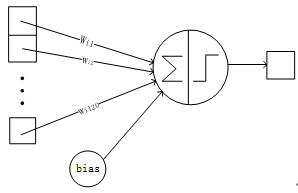

The convolution structure of C3 and the first 3 graphs in S2 is shown below:

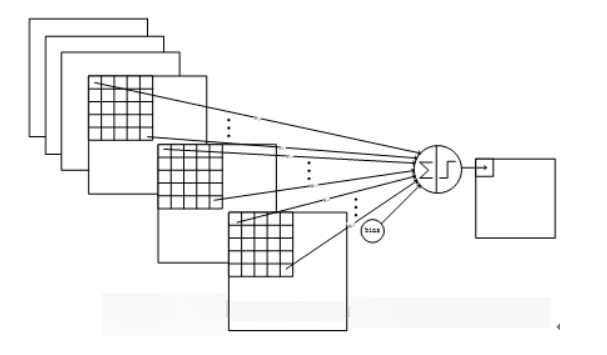

#### **S4 layer-pooling layer (downsampling layer)**

>**Input**: 10 * 10

>**Sampling area**: 2 * 2

>**Sampling method**: 4 inputs are added, multiplied by a trainable parameter, plus a trainable offset. Results via sigmoid

>**Sampling type**: 16

>**Output featureMap size**: 5 * 5 (10/2)

>**Number of neurons**: 5 * 5 * 16 = 400

>**Trainable parameters**: 2 * 16 = 32 (the weight of the sum + the offset)

>**Number of connections**: 16 * (2 * 2 + 1) * 5 * 5 = 2000

>The size of each feature map in S4 is 1/4 of the size of the feature map in C3

**Detailed description:**

S4 is the pooling layer, the window size is still 2 * 2, a total of 16 feature maps, and the 16 10x10 maps of the C3 layer are pooled in units of 2x2 to obtain 16 5x5 feature maps. This layer has a total of 32 training parameters of 2x16, 5x5x5x16 = 2000 connections. 

*The connection is similar to the S2 layer.*

#### **C5 layer-convolution layer**

>**Input**: All 16 unit feature maps of the S4 layer (all connected to s4)

>**Convolution kernel size**: 5 * 5

>**Convolution kernel type**: 120

>**Output featureMap size**: 1 * 1 (5-5 + 1)

>**Trainable parameters / connection**: 120 * (16 * 5 * 5 + 1) = 48120

**Detailed description:**


The C5 layer is a convolutional layer. Since the size of the 16 images of the S4 layer is 5x5, which is the same as the size of the convolution kernel, the size of the image formed after convolution is 1x1. This results in 120 convolution results. Each is connected to the 16 maps on the previous level. So there are (5x5x16 + 1) x120 = 48120 parameters, and there are also 48120 connections. The network structure of the C5 layer is as follows:

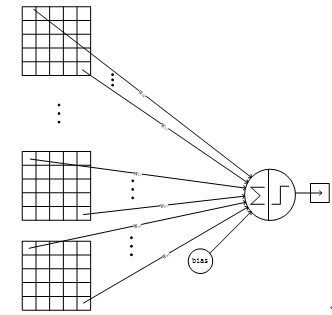

#### **F6 layer-fully connected layer**

>**Input**: c5 120-dimensional vector

>**Calculation method**: calculate the dot product between the input vector and the weight vector, plus an offset, and the result is output through the sigmoid function.

>**Trainable parameters**: 84 * (120 + 1) = 10164

**Detailed description:**

Layer 6 is a fully connected layer. The F6 layer has 84 nodes, corresponding to a 7x12 bitmap, -1 means white, 1 means black, so the black and white of the bitmap of each symbol corresponds to a code. The training parameters and number of connections for this layer are (120 + 1) x84 = 10164. The ASCII encoding diagram is as follows:

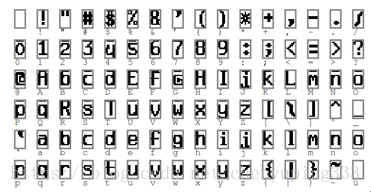

The connection method of the F6 layer is as follows:

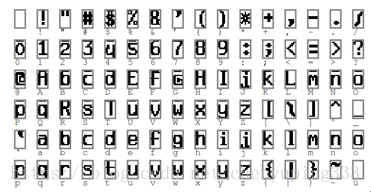


#### **Output layer-fully connected layer**

The output layer is also a fully connected layer, with a total of 10 nodes, which respectively represent the numbers 0 to 9, and if the value of node i is 0, the result of network recognition is the number i. A radial basis function (RBF) network connection is used. Assuming x is the input of the previous layer and y is the output of the RBF, the calculation of the RBF output is:

$$y_i= \sum_{j}(x_j- w_{ij})^2$$

The value of the above formula w_ij is determined by the bitmap encoding of i, where i ranges from 0 to 9, and j ranges from 0 to 7 * 12-1. The closer the value of the RBF output is to 0, the closer it is to i, that is, the closer to the ASCII encoding figure of i, it means that the recognition result input by the current network is the character i. This layer has 84x10 = 840 parameters and connections.

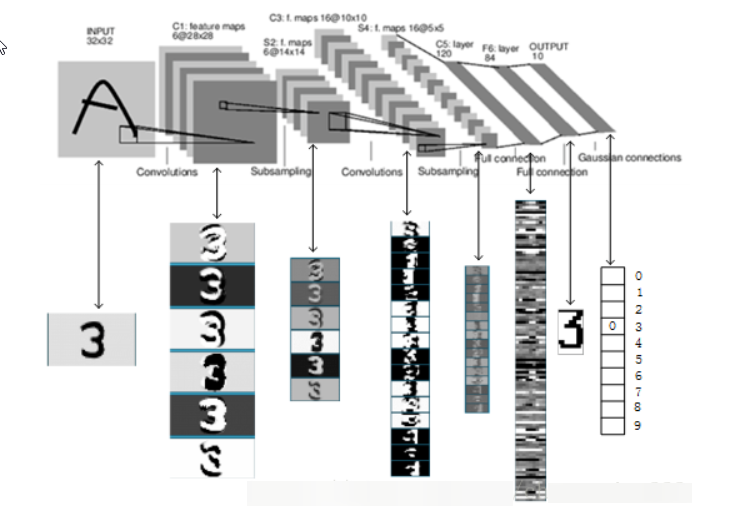

**Summary**


* LeNet-5 is a very efficient convolutional neural network for handwritten character recognition.
* Convolutional neural networks can make good use of the structural information of images.
* The convolutional layer has fewer parameters, which is also determined by the main characteristics of the convolutional layer, that is, local connection and shared weights.

### Code Implementation

In [6]:
import keras
from keras.datasets import mnist
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Flatten
from keras.models import Sequential

# Loading the dataset and perform splitting
(x_train, y_train), (x_test, y_test) = mnist.load_data()
# Peforming reshaping operation
x_train = x_train.reshape(x_train.shape[0], 28, 28, 1)
x_test = x_test.reshape(x_test.shape[0], 28, 28, 1)

# Normalization
x_train = x_train / 255
x_test = x_test / 255

# One Hot Encoding
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)
# Building the Model Architecture

model = Sequential()
# Select 6 feature convolution kernels with a size of 5 * 5 (without offset), and get 66 feature maps. The size of each feature map is 32−5 + 1 = 2832−5 + 1 = 28.
# That is, the number of neurons has been reduced from 10241024 to 28 ∗ 28 = 784 28 ∗ 28 = 784.
# Parameters between input layer and C1 layer: 6 ∗ (5 ∗ 5 + 1)
model.add(Conv2D(6, kernel_size=(5, 5), activation='relu', input_shape=(28, 28, 1)))
# The input of this layer is the output of the first layer, which is a 28 * 28 * 6 node matrix.
# The size of the filter used in this layer is 2 * 2, and the step length and width are both 2, so the output matrix size of this layer is 14 * 14 * 6.
model.add(MaxPooling2D(pool_size=(2, 2)))
# The input matrix size of this layer is 14 * 14 * 6, the filter size used is 5 * 5, and the depth is 16. This layer does not use all 0 padding, and the step size is 1.
# The output matrix size of this layer is 10 * 10 * 16. This layer has 5 * 5 * 6 * 16 + 16 = 2416 parameters
model.add(Conv2D(16, kernel_size=(5, 5), activation='relu'))
# The input matrix size of this layer is 10 * 10 * 16. The size of the filter used in this layer is 2 * 2, and the length and width steps are both 2, so the output matrix size of this layer is 5 * 5 * 16.
model.add(MaxPooling2D(pool_size=(2, 2)))
# The input matrix size of this layer is 5 * 5 * 16. This layer is called a convolution layer in the LeNet-5 paper, but because the size of the filter is 5 * 5, #
# So it is not different from the fully connected layer. If the nodes in the 5 * 5 * 16 matrix are pulled into a vector, then this layer is the same as the fully connected layer.
# The number of output nodes in this layer is 120, with a total of 5 * 5 * 16 * 120 + 120 = 48120 parameters.
model.add(Flatten())
model.add(Dense(120, activation='relu'))
# The number of input nodes in this layer is 120 and the number of output nodes is 84. The total parameter is 120 * 84 + 84 = 10164 (w + b)
model.add(Dense(84, activation='relu'))
# The number of input nodes in this layer is 84 and the number of output nodes is 10. The total parameter is 84 * 10 + 10 = 850
model.add(Dense(10, activation='softmax'))
model.compile(loss=keras.metrics.categorical_crossentropy, optimizer=keras.optimizers.Adam(), metrics=['accuracy'])
model.fit(x_train, y_train, batch_size=128, epochs=20, verbose=1, validation_data=(x_test, y_test))
score = model.evaluate(x_test, y_test)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Train on 60000 samples, validate on 10000 samples
Epoch 1/20
60000/60000 [==============================] - 289s 5ms/step - loss: 0.3274 - acc: 0.9031 - val_loss: 0.1144 - val_acc: 0.9630
Epoch 2/20
60000/60000 [==============================] - 6s 105us/step - loss: 0.0991 - acc: 0.9702 - val_loss: 0.0647 - val_acc: 0.9784
Epoch 3/20
60000/60000 [==============================] - 7s 108us/step - loss: 0.0693 - acc: 0.9791 - val_loss: 0.0514 - val_acc: 0.98367 - a
Epoch 4/20
60000/60000 [==============================] - 6s 103us/step - loss: 0.0566 - acc: 0.9824 - val_loss: 0.0489 - val_acc: 0.9837
Epoch 5/20
60000/60000 [==============================] - 6s 102us/step - loss: 0.0488 - acc: 0.9850 - val_loss: 0.0364 - val_acc: 0.9883491 - ac
Epoch 6/20
60000/60000 [==============================] - 6s 103us/step - loss: 0.0400 - acc: 0.9874 - val_loss: 0.0451 - val_a

## AlexNet

### Introduction

>AlexNet was designed by Hinton, winner of the 2012 ImageNet competition, and his student Alex Krizhevsky. It was also after that year that more and deeper neural networks were proposed, such as the excellent vgg, GoogleLeNet. Its official data model has an accuracy rate of 57.1% and top 1-5 reaches 80.2%. This is already quite outstanding for traditional machine learning classification algorithms.


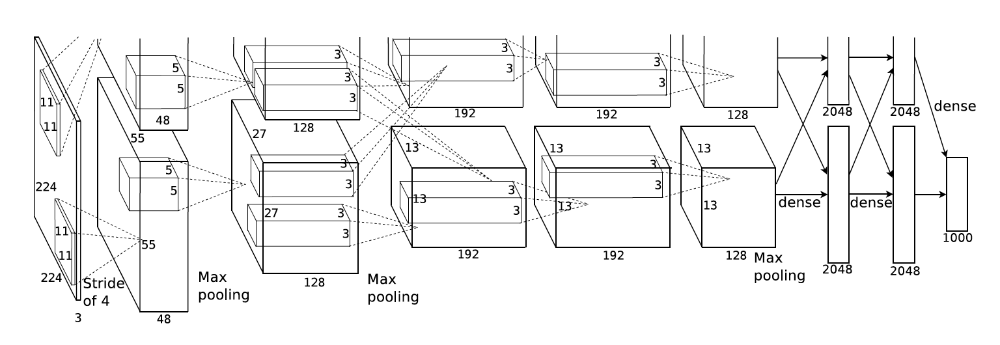


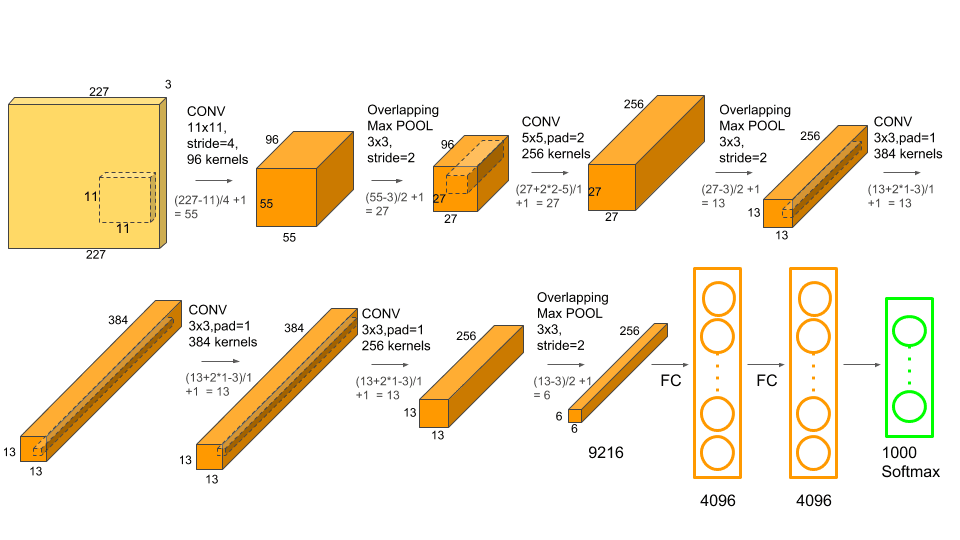

>The following table below explains the network structure of AlexNet:



<table>
<thead>
	<tr>
		<th>Size / Operation</th>
		<th>Filter</th>
		<th>Depth</th>
		<th>Stride</th>
		<th>Padding</th>
		<th>Number of Parameters</th>
		<th>Forward Computation</th>
	</tr>
</thead>
<tbody>
	<tr>
		<td>3* 227 * 227</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Conv1 + Relu</td>
		<td>11 * 11</td>
		<td>96</td>
		<td>4</td>
		<td></td>
		<td>(11*11*3 + 1) * 96=34944</td>
		<td>(11*11*3 + 1) * 96 * 55 * 55=105705600</td>
	</tr>
	<tr>
		<td>96 * 55 * 55</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Max Pooling</td>
		<td>3 * 3</td>
		<td></td>
		<td>2</td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>96 * 27 * 27</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Norm</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Conv2 + Relu</td>
		<td>5 * 5</td>
		<td>256</td>
		<td>1</td>
		<td>2</td>
		<td>(5 * 5 * 96 + 1) * 256=614656</td>
		<td>(5 * 5 * 96 + 1) * 256 * 27 * 27=448084224</td>
	</tr>
	<tr>
		<td>256 * 27 * 27</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Max Pooling</td>
		<td>3 * 3</td>
		<td></td>
		<td>2</td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>256 * 13 * 13</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Norm</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Conv3 + Relu</td>
		<td>3 * 3</td>
		<td>384</td>
		<td>1</td>
		<td>1</td>
		<td>(3 * 3 * 256 + 1) * 384=885120</td>
		<td>(3 * 3 * 256 + 1) * 384 * 13 * 13=149585280</td>
	</tr>
	<tr>
		<td>384 * 13 * 13</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Conv4 + Relu</td>
		<td>3 * 3</td>
		<td>384</td>
		<td>1</td>
		<td>1</td>
		<td>(3 * 3 * 384 + 1) * 384=1327488</td>
		<td>(3 * 3 * 384 + 1) * 384 * 13 * 13=224345472</td>
	</tr>
	<tr>
		<td>384 * 13 * 13</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Conv5 + Relu</td>
		<td>3 * 3</td>
		<td>256</td>
		<td>1</td>
		<td>1</td>
		<td>(3 * 3 * 384 + 1) * 256=884992</td>
		<td>(3 * 3 * 384 + 1) * 256 * 13 * 13=149563648</td>
	</tr>
	<tr>
		<td>256 * 13 * 13</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Max Pooling</td>
		<td>3 * 3</td>
		<td></td>
		<td>2</td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>256 * 6 * 6</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Dropout (rate 0.5)</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>FC6 + Relu</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td>256 * 6 * 6 * 4096=37748736</td>
		<td>256 * 6 * 6 * 4096=37748736</td>
	</tr>
	<tr>
		<td>4096</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Dropout (rate 0.5)</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>FC7 + Relu</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td>4096 * 4096=16777216</td>
		<td>4096 * 4096=16777216</td>
	</tr>
	<tr>
		<td>4096</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>FC8 + Relu</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td>4096 * 1000=4096000</td>
		<td>4096 * 1000=4096000</td>
	</tr>
	<tr>
		<td>1000 classes</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
	</tr>
	<tr>
		<td>Overall</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td>62369152=62.3 million</td>
		<td>1135906176=1.1 billion</td>
	</tr>
	<tr>
		<td>Conv VS FC</td>
		<td></td>
		<td></td>
		<td></td>
		<td></td>
		<td>Conv:3.7million (6%) , FC: 58.6 million  (94% )</td>
		<td>Conv: 1.08 billion (95%) , FC: 58.6 million (5%)</td>
	</tr>
</tbody>
</table>





### Why does AlexNet achieve better results?

1. **Relu activation function is used.**

**Relu function: f (x) = max (0, x)**

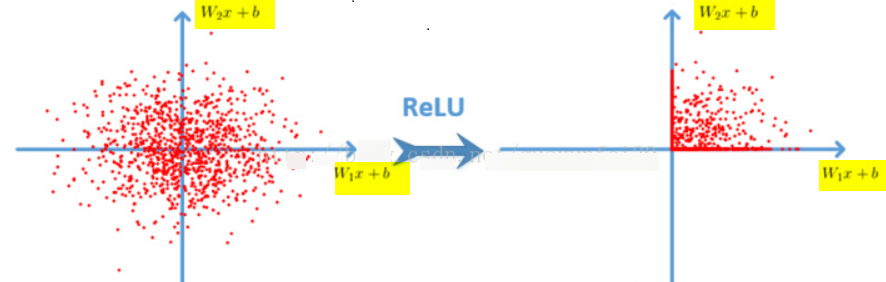

ReLU-based deep convolutional networks are trained several times faster than tanh and sigmoid- based networks. The following figure shows the number of iterations for a four-layer convolutional network based on CIFAR-10 that reached 25% training error in tanh and ReLU:

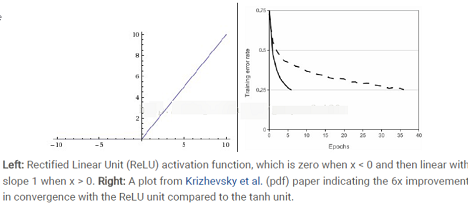

2. **Standardization ( Local Response Normalization )**

After using ReLU f (x) = max (0, x), you will find that the value after the activation function has no range like the tanh and sigmoid functions, so a normalization will usually be done after ReLU, and the LRU is a steady proposal (Not sure here, it should be proposed?) One method in neuroscience is called "Lateral inhibition", which talks about the effect of active neurons on its surrounding neurons.

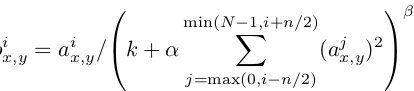

3. **Dropout**

Dropout is also a concept often said, which can effectively prevent overfitting of neural networks. Compared to the general linear model, a regular method is used to prevent the model from overfitting. In the neural network, Dropout is implemented by modifying the structure of the neural network itself. For a certain layer of neurons, randomly delete some neurons with a defined probability, while keeping the individuals of the input layer and output layer neurons unchanged, and then update the parameters according to the learning method of the neural network. In the next iteration, rerandom Remove some neurons until the end of training.

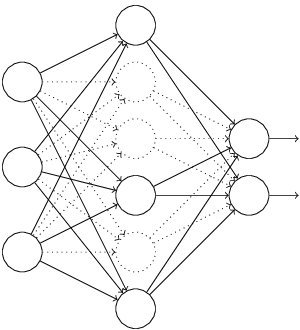

4. **Enhanced Data ( Data Augmentation )**

**In deep learning, when the amount of data is not large enough, there are generally 4 solutions:**

>  Data augmentation- artificially increase the size of the training set-create a batch of "new" data from existing data by means of translation, flipping, noise

>  Regularization——The relatively small amount of data will cause the model to overfit, making the training error small and the test error particularly large. By adding a regular term after the Loss Function , the overfitting can be suppressed. The disadvantage is that a need is introduced Manually adjusted hyper-parameter.

>  Dropout- also a regularization method. But different from the above, it is achieved by randomly setting the output of some neurons to zero

>  Unsupervised Pre-training- use Auto-Encoder or RBM's convolution form to do unsupervised pre-training layer by layer, and finally add a classification layer to do supervised Fine-Tuning.

### Code Implementation

In [22]:
!pip install tflearn 

In [23]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Flatten,\
 Conv2D, MaxPooling2D
from keras.layers.normalization import BatchNormalization
import numpy as np
np.random.seed(1000)

# (2) Get Data
import tflearn.datasets.oxflower17 as oxflower17
x, y = oxflower17.load_data(one_hot=True)

# (3) Create a sequential model
model = Sequential()

# 1st Convolutional Layer
model.add(Conv2D(filters=96, input_shape=(224,224,3), kernel_size=(11,11),\
 strides=(4,4), padding='valid'))
model.add(Activation('relu'))
# Pooling 
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))
# Batch Normalisation before passing it to the next layer
model.add(BatchNormalization())

# 2nd Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(11,11), strides=(1,1), padding='valid'))
model.add(Activation('relu'))
# Pooling
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))
# Batch Normalisation
model.add(BatchNormalization())

# 3rd Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='valid'))
model.add(Activation('relu'))
# Batch Normalisation
model.add(BatchNormalization())

# 4th Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='valid'))
model.add(Activation('relu'))
# Batch Normalisation
model.add(BatchNormalization())

# 5th Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), padding='valid'))
model.add(Activation('relu'))
# Pooling
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))
# Batch Normalisation
model.add(BatchNormalization())

# Passing it to a dense layer
model.add(Flatten())
# 1st Dense Layer
model.add(Dense(4096, input_shape=(224*224*3,)))
model.add(Activation('relu'))
# Add Dropout to prevent overfitting
model.add(Dropout(0.4))
# Batch Normalisation
model.add(BatchNormalization())

# 2nd Dense Layer
model.add(Dense(4096))
model.add(Activation('relu'))
# Add Dropout
model.add(Dropout(0.4))
# Batch Normalisation
model.add(BatchNormalization())

# 3rd Dense Layer
model.add(Dense(1000))
model.add(Activation('relu'))
# Add Dropout
model.add(Dropout(0.4))
# Batch Normalisation
model.add(BatchNormalization())

# Output Layer
model.add(Dense(17))
model.add(Activation('softmax'))

model.summary()

# (4) Compile 
model.compile(loss='categorical_crossentropy', optimizer='adam',\
 metrics=['accuracy'])

# (5) Train
model.fit(x, y, batch_size=64, epochs=1, verbose=1, \
validation_split=0.2, shuffle=True)

W0210 15:30:06.265085 14612 deprecation_wrapper.py:119] From c:\users\soura\anaconda3\envs\tensor\lib\site-packages\tflearn\helpers\summarizer.py:9: The name tf.summary.merge is deprecated. Please use tf.compat.v1.summary.merge instead.

W0210 15:30:06.267129 14612 deprecation_wrapper.py:119] From c:\users\soura\anaconda3\envs\tensor\lib\site-packages\tflearn\helpers\trainer.py:25: The name tf.summary.FileWriter is deprecated. Please use tf.compat.v1.summary.FileWriter instead.

W0210 15:30:06.295092 14612 deprecation_wrapper.py:119] From c:\users\soura\anaconda3\envs\tensor\lib\site-packages\tflearn\collections.py:13: The name tf.GraphKeys is deprecated. Please use tf.compat.v1.GraphKeys instead.

W0210 15:30:06.309086 14612 deprecation_wrapper.py:119] From c:\users\soura\anaconda3\envs\tensor\lib\site-packages\tflearn\config.py:123: The name tf.get_collection is deprecated. Please use tf.compat.v1.get_collection instead.

W0210 15:30:06.329090 14612 deprecation_wrapper.py:119] From c

curses is not supported on this machine (please install/reinstall curses for an optimal experience)


100.0% 60276736 / 60270631


('Succesfully downloaded', '17flowers.tgz', 60270631, 'bytes.')
File Extracted
Starting to parse images...
Parsing Done!


W0210 15:30:49.767401 14612 deprecation_wrapper.py:119] From c:\users\soura\anaconda3\envs\tensor\lib\site-packages\keras\backend\tensorflow_backend.py:4070: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 54, 54, 96)        34944     
_________________________________________________________________
activation_1 (Activation)    (None, 54, 54, 96)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 27, 27, 96)        384       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 17, 17, 256)       2973952   
_________________________________________________________________
activation_2 (Activation)    (None, 17, 17, 256)       0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 256)        

W0210 15:31:00.057994 14612 deprecation_wrapper.py:119] From c:\users\soura\anaconda3\envs\tensor\lib\site-packages\keras\backend\tensorflow_backend.py:422: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.



Train on 1088 samples, validate on 272 samples
Epoch 1/1
1088/1088 [==============================] - 27s 25ms/step - loss: 2.8976 - accuracy: 0.2344 - val_loss: 78.0927 - val_accuracy: 0.0551


## VGG-Net

#### Introduction

>The full name of VGG is the Visual Geometry Group, which belongs to the Department of Science and Engineering of Oxford University. It has released a series of convolutional network models beginning with VGG, which can be applied to face recognition and image classification, from VGG16 to VGG19. The original purpose of VGG's research on the depth of convolutional networks is to understand how the depth of convolutional networks affects the accuracy and accuracy of large-scale image classification and recognition. -Deep-16 CNN), in order to deepen the number of network layers and to avoid too many parameters, a small 3x3 convolution kernel is used in all layers.


<a href="http://ethereon.github.io/netscope/#/gist/dc5003de6943ea5a6b8b" target="_blank">Network Structure of VGG19</a>

#### The network structure

>The input of VGG is set to an RGB image of 224x244 size. The average RGB value is calculated for all images on the training set image, and then the image is input as an input to the VGG convolution network. A 3x3 or 1x1 filter is used, and the convolution step is fixed. . There are 3 VGG fully connected layers, which can vary from VGG11 to VGG19 according to the total number of convolutional layers + fully connected layers. The minimum VGG11 has 8 convolutional layers and 3 fully connected layers. The maximum VGG19 has 16 convolutional layers. +3 fully connected layers. In addition, the VGG network is not followed by a pooling layer behind each convolutional layer, or a total of 5 pooling layers distributed under different convolutional layers. The following figure is VGG Structure diagram:


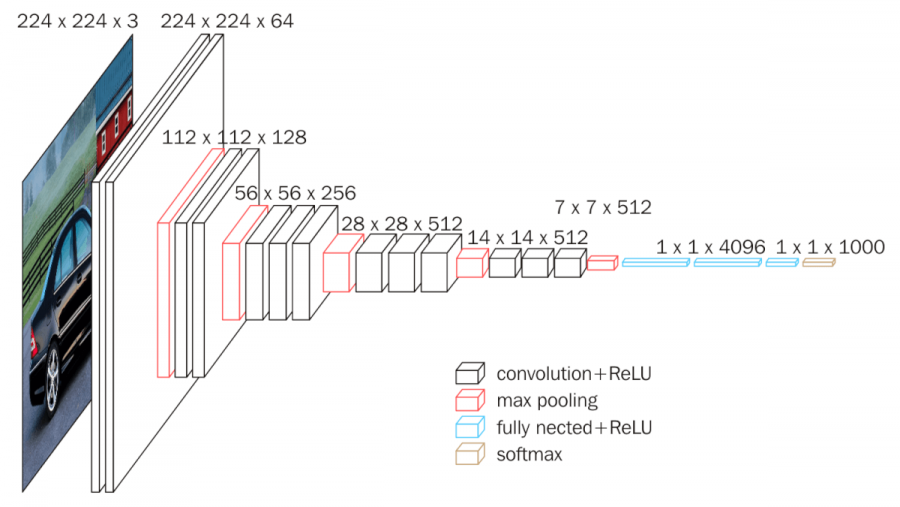

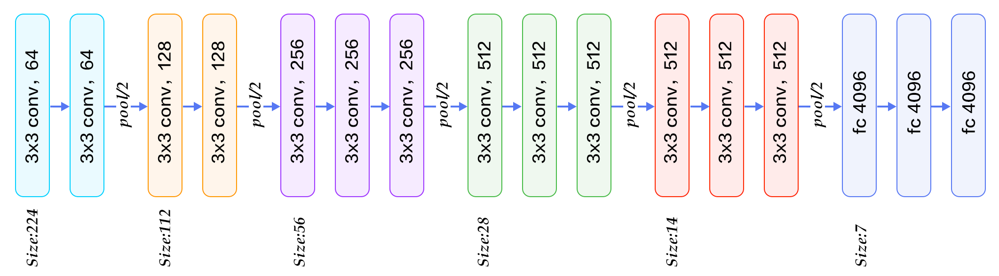

>VGG16 contains 16 layers and VGG19 contains 19 layers. A series of VGGs are exactly the same in the last three fully connected layers. The overall structure includes 5 sets of convolutional layers, followed by a MaxPool. The difference is that more and more cascaded convolutional layers are included in the five sets of convolutional layers .

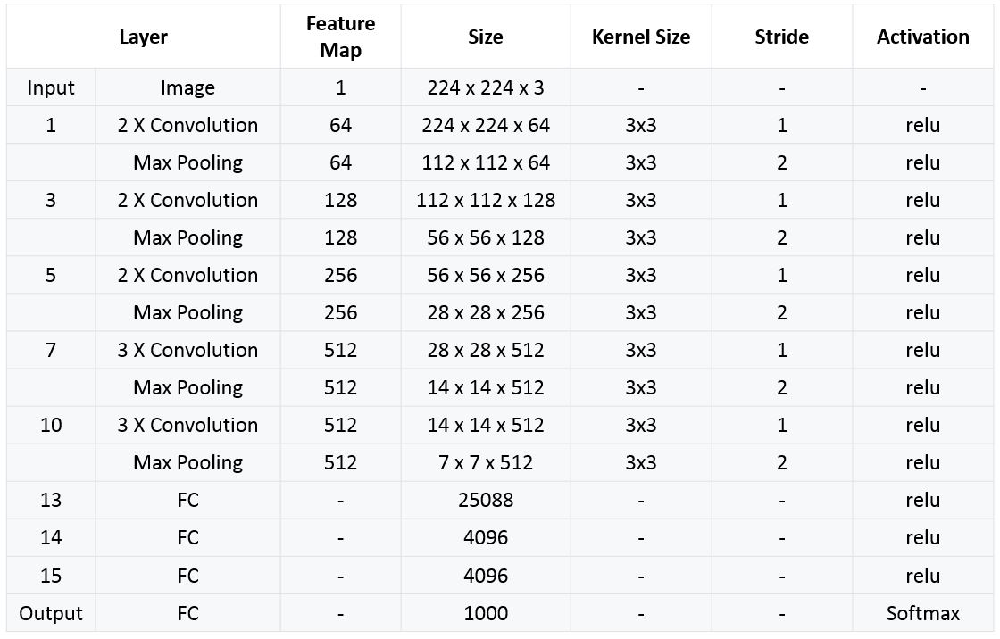

> Each convolutional layer in AlexNet contains only one convolution, and the size of the convolution kernel is 7 * 7 ,. In VGGNet, each convolution layer contains 2 to 4 convolution operations. The size of the convolution kernel is 3 * 3, the convolution step size is 1, the pooling kernel is 2 * 2, and the step size is 2. The most obvious improvement of VGGNet is to reduce the size of the convolution kernel and increase the number of convolution layers.


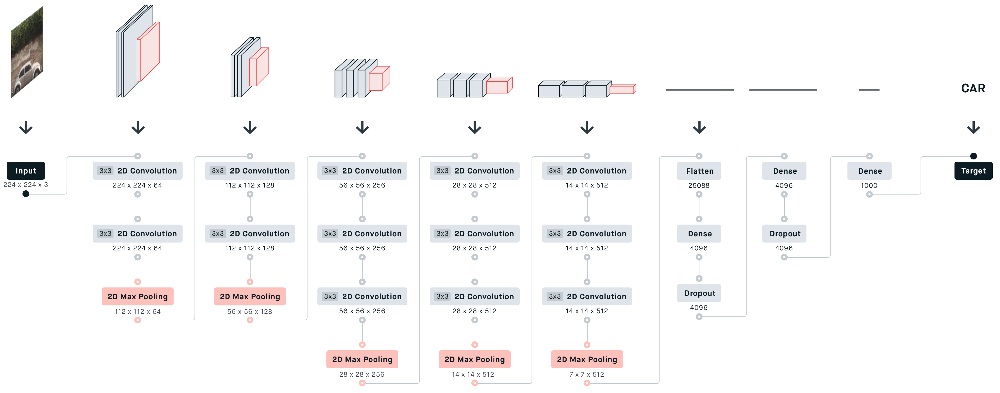


> Using multiple convolution layers with smaller convolution kernels instead of a larger convolution layer with convolution kernels can reduce parameters on the one hand, and the author believes that it is equivalent to more non-linear mapping, which increases the Fit expression ability.

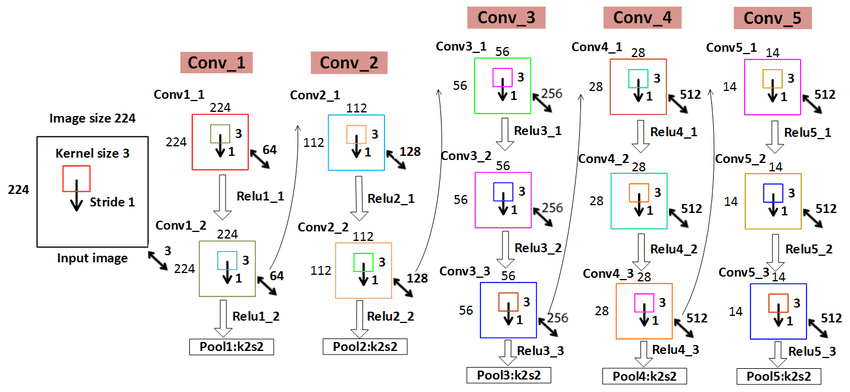

>Two consecutive 3 * 3 convolutions are equivalent to a 5 * 5 receptive field, and three are equivalent to 7 * 7. The advantages of using three 3 * 3 convolutions instead of one 7 * 7 convolution are twofold : one, including three ReLu layers instead of one , makes the decision function more discriminative; and two, reducing parameters . For example, the input and output are all C channels. 3 convolutional layers using 3 * 3 require 3 (3 * 3 * C * C) = 27 * C * C, and 1 convolutional layer using 7 * 7 requires 7 * 7 * C * C = 49C * C. This can be seen as applying a kind of regularization to the 7 * 7 convolution, so that it is decomposed into three 3 * 3 convolutions.

>The 1 * 1 convolution layer is mainly to increase the non-linearity of the decision function without affecting the receptive field of the convolution layer. Although the 1 * 1 convolution operation is linear, ReLu adds non-linearity.

### Network Configuration

> Table 1 shows all network configurations. These networks follow the same design principles, but differ in depth.

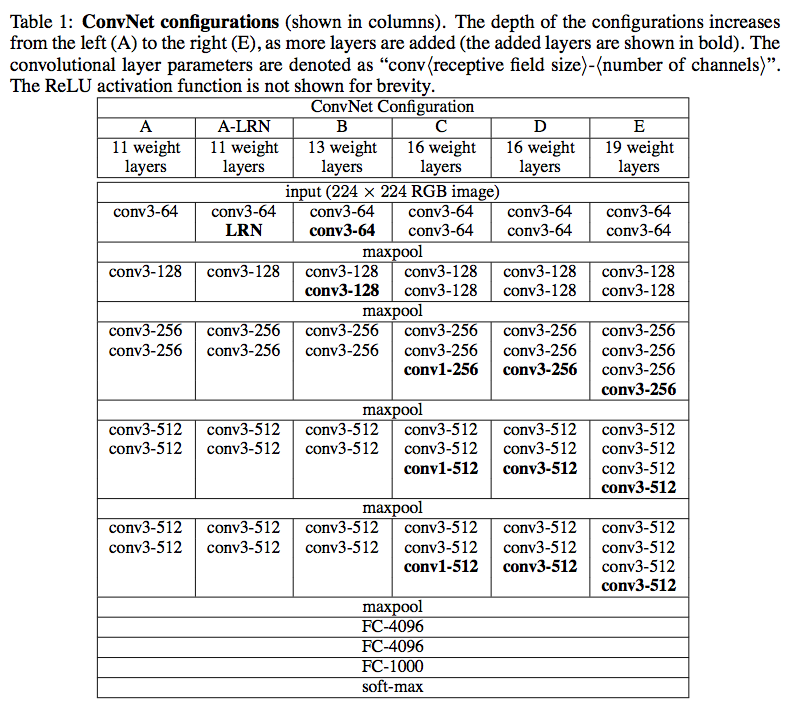

>This picture is definitely used when introducing VGG16. This picture contains a lot of information. My interpretation here may be limited. If you have any supplements, please leave a message.

* **Number 1** : This is a comparison chart of 6 networks. From A to E, the network is getting deeper. Several layers have been added to verify the effect.

* **Number 2** : Each column explains the structure of each network in detail.

* **Number 3**: This is a correct way to do experiments, that is, use the simplest method to solve the problem , and then gradually optimize for the problems that occur.

**Network A**: First mention a shallow network, this network can easily converge on ImageNet.
And then?

**Network A-LRN**: Add something that someone else (AlexNet) has experimented to say is effective (LRN), but it seems useless.
And then?

**Network B**: Then try adding 2 layers? Seems to be effective.
And then?

**Network C**: Add two more layers of 1 * 1 convolution, and it will definitely converge. The effect seems to be better. A little excited.
And then?

**Network D**: Change the 1 * 1 convolution kernel to 3 * 3. Try it. The effect has improved again. Seems to be the best (2014).

#### Training

**The optimization method** is a stochastic gradient descent SGD + momentum (0.9) with momentum.
The batch size is 256.

**Regularization** : L2 regularization is used, and the weight decay is 5e-4. Dropout is after the first two fully connected layers, p = 0.5.

Although it is deeper and has more parameters than the AlexNet network, we speculate that VGGNet can converge in less cycles for two reasons: one, the greater depth and smaller convolutions bring implicit regularization ; Second, some layers of pre-training.

**Parameter initialization** : For a shallow A network, parameters are randomly initialized, the weight w is sampled from N (0, 0.01), and the bias is initialized to 0. Then, for deeper networks, first the first four convolutional layers and three fully connected layers are initialized with the parameters of the A network. However, it was later discovered that it is also possible to directly initialize it without using pre-trained parameters.

In order to obtain a 224 * 224 input image, each rescaled image is randomly cropped in each SGD iteration. In order to enhance the data set, the cropped image is also randomly flipped horizontally and RGB color shifted.



### Summary of VGGNet improvement points
 
1. A smaller 3 * 3 convolution kernel and a deeper network are used . The stack of two 3 * 3 convolution kernels is relative to the field of view of a 5 * 5 convolution kernel, and the stack of three 3 * 3 convolution kernels is equivalent to the field of view of a 7 * 7 convolution kernel. In this way, there can be fewer parameters (3 stacked 3 * 3 structures have only 7 * 7 structural parameters (3 * 3 * 3) / (7 * 7) = 55%); on the other hand, they have more The non-linear transformation increases the ability of CNN to learn features.

 
2. In the convolutional structure of VGGNet, a 1 * 1 convolution kernel is introduced. Without affecting the input and output dimensions, non-linear transformation is introduced to increase the expressive power of the network and reduce the amount of calculation.

 
3. During training, first train a simple (low-level) VGGNet A-level network, and then use the weights of the A network to initialize the complex models that follow to speed up the convergence of training .


### Some basic questions

**Q1: Why can 3 3x3 convolutions replace 7x7 convolutions?**

***Answer 1***

3 3x3 convolutions, using 3 non-linear activation functions, increasing non-linear expression capabilities, making the segmentation plane more separable
Reduce the number of parameters. For the convolution kernel of C channels, 7x7 contains parameters , and the number of 3 3x3 parameters is greatly reduced.


**Q2: The role of 1x1 convolution kernel**

***Answer 2***

Increase the nonlinearity of the model without affecting the receptive field
1x1 winding machine is equivalent to linear transformation, and the non-linear activation function plays a non-linear role


**Q3: The effect of network depth on results (in the same year, Google also independently released the network GoogleNet with a depth of 22 layers)**

***Answer 3***

VGG and GoogleNet models are deep
Small convolution
VGG only uses 3x3, while GoogleNet uses 1x1, 3x3, 5x5, the model is more complicated (the model began to use a large convolution kernel to reduce the calculation of the subsequent machine layer)


### Code Implementation

In [ ]:
from keras.layers import Input, Lambda, Dense, Flatten
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
IMAGE_SIZE = [224, 224]

In [ ]:
train_path = 'data/train'
test_path = 'data/test'

In [ ]:
vgg = VGG16(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [ ]:
# don't train existing weights
for layer in vgg.layers:
  layer.trainable = False

In [ ]:
# useful for getting number of classes
folders = glob('data/train/*')
print(len(folders))

In [ ]:
x = Flatten()(vgg.output)
prediction = Dense(len(folders), activation='softmax')(x)
model = Model(inputs=vgg.input, outputs=prediction)
model.summary()

In [ ]:
from keras import optimizers


sgd = optimizers.SGD(lr=0.01, decay=1e-6, momentum=0.9)
model.compile(loss='binary_crossentropy',
              optimizer=sgd,
              metrics=['accuracy'])

In [ ]:
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

In [ ]:
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

In [ ]:
train_set = train_datagen.flow_from_directory('data/train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

test_set = test_datagen.flow_from_directory('data/test',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

In [ ]:
from datetime import datetime
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau

#lr_scheduler = LearningRateScheduler(lr_schedule)

lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=5,
                               min_lr=0.5e-6)

#num_epochs = 1000
#num_batch_size = 32

checkpoint = ModelCheckpoint(filepath='mymodel.h5', 
                               verbose=1, save_best_only=True)

callbacks = [checkpoint, lr_reducer, lr_scheduler]

start = datetime.now()

model.fit_generator(
  train_set,
  validation_data=test_set,
  epochs=10,
  steps_per_epoch=5,
  validation_steps=32,
    callbacks=callbacks ,verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

## Inception

Also known as GoogLeNet , it is a 22-layer network that won the 2014 ILSVRC Championship.

1. The original intention of the design is to expand the width and depth on its basis .

2. which is designed motives derived from improving the performance of the depth of the network generally can increase the size of the network and increase the size of the data set to increase, but at the same time cause the network parameters and easily fit through excessive , computing resources inefficient and The production of high-quality data sets is an expensive issue.

3. Its design philosophy is to change the full connection to a sparse architecture and try to change it to a sparse architecture inside the convolution.

4. The main idea is to design an inception module and increase the depth and width of the network by continuously copying these inception modules , but GooLeNet mainly extends these inception modules in depth.

There are four parallel channels in each inception module , and concat is performed at the end of the channel .

1x1 conv is mainly used to reduce the dimensions in the article to avoid calculation bottlenecks.
It also adds additional softmax loss to some branches of the previous network layer to avoid the problem of gradient disappearance.

**Four parallel channels:**

* 1x1 conv: Borrowed from [ Network in Network ], the input feature map can be reduced in dimension and upgraded without too much loss of the input spatial information;
* 1x1conv followed by 3x3 conv: 3x3 conv increases the receptive field of the feature map, and changes the dimension through 1x1conv;
* 1x1 conv followed by 5x5 conv: 5x5 conv further increases the receptive field of the feature map, and changes the dimensions through 1x1 conv;
* 3x3 max pooling followed by 1x1 conv: The author believes that although the pooling layer will lose space information, it has been effectively applied in many fields, which proves its effectiveness, so a parallel channel is added, and it is changed by 1x1 conv Its output dimension.

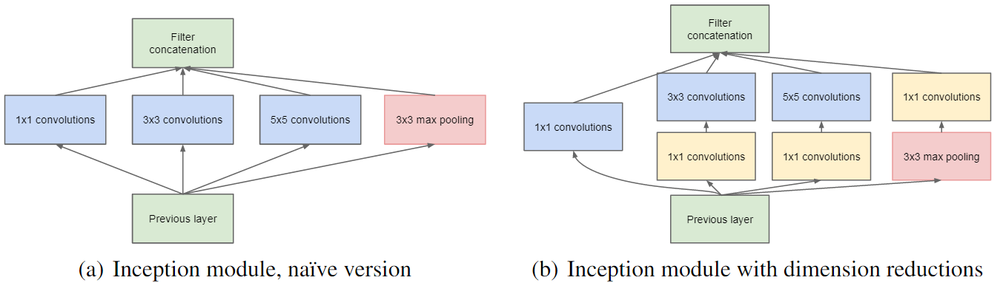

#### Complete network design : - 

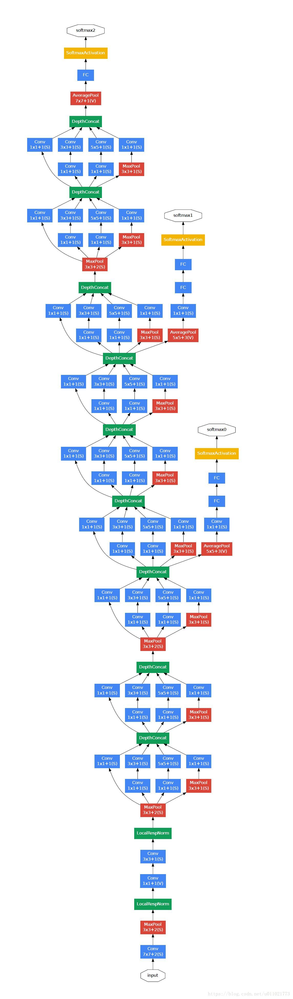

### Two ways to improve network performance:

**The most direct way to improve the performance of deep neural networks is to increase their size . This includes depth, the number of levels, and their width, the size of each level unit .**

Another easy and safe way is to **increase the size of the training data**.

However, *both methods have two disadvantages* .

Larger models mean more parameters, which makes it easier for the network to overfit , especially when the number of label samples in the training data set is limited.

At the same time, because the production of high-quality training sets is tricky and expensive ,especially when some human experts do it , there is a large error rate . As shown below.

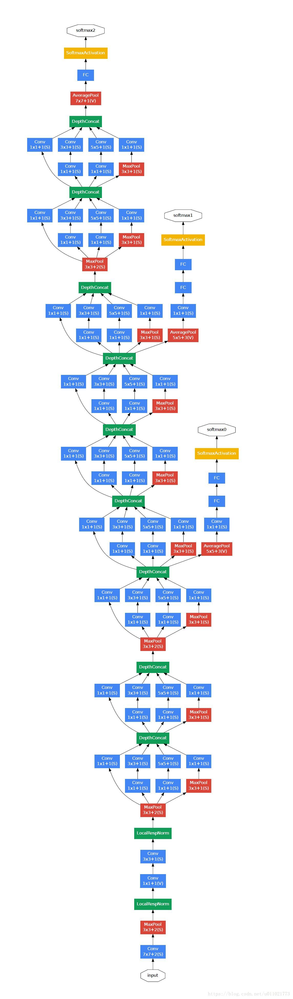

*Another shortcoming is that uniformly increasing the size of the network will increase the use of computing resources* . For example, in a deep network, if two convolutions are chained, any unified improvement of their convolution kernels will cause demand for resources. 

Power increase: If the increased capacity is inefficient, for example, if most of the weights end with 0 , then a lot of computing resources are wasted. But because the computing resources are always limited, an effective computational distribution always tends to increase the size of the model indiscriminately, and even the main objective goal is to improve the performance of the results.

The basic method to solve these two problems is to finally change the fully connected network to a sparse architecture, even inside the convolution.

The details of the GooLeNet network layer are shown in the following table:

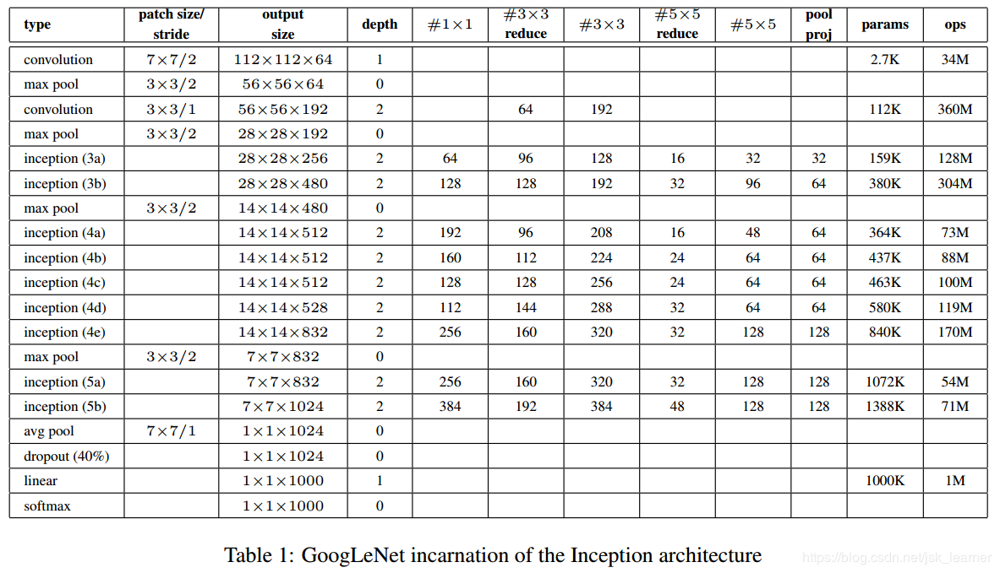

**To sum up:**

* 128 1x1 convolution kernels are used to reduce dimensions and modify linear activation units
* A fully connected layer of 1024 units and a modified linear activation unit;
* A dropout layer that drops neuron connections with a 70% probability;
* A linear layer with softmax loss as classification
Predict 1000 categories, but removed during the inference phase

**Training Methodology**

>The momentum is set to 0.9 and the learning rate is set to decrease by 4% every 8 epochs. 

>Seven models were trained . To make the problem more detailed, some models were trained on small crops, and some were trained on large crops .

>The factors that make the model train well include : the sampling of patches of various sizes in the image , the size of which is evenly distributed between 8% and 100%, and the aspect ratio between 3/4 and 4/3.

> **Illumination changes have an effect on avoiding overfitting.**

> **Later, random interpolation is used to resize the image.**

### Inception-v2(2015)


This architecture is a landmark in the development of deep network models . The most prominent contribution is to propose a normalized Batch Normalization layer to unify the output range of the network. It is fixed in a relatively uniform range. If the BN layer is not added, the value range of the network input and output of each layer is greatly different, so the size of the learning rate will be different. The BN layer avoids this situation This accelerates the training of the network and gives the network regular terms to a certain extent , reducing the degree of overfitting of the network. In the subsequent development of network models, most models have more or less added BN layers to the model.

In this paper, the BN layer is standardized before being input to the activation function. At the same time, VGG uses 2 3x3 convs instead of 5x5 convs in the inception module to reduce the amount of parameters and speed up the calculation.

Algorithm advantages:
1. **Improved learning rate** : In the BN model, a higher learning rate is used to accelerate training convergence, but it will not cause other effects. Because if the scale of each layer is different, then the learning rate required by each layer is different. The scale of the same layer dimension often also needs different learning rates. Usually, the minimum learning is required to ensure the loss function to decrease, but The BN layer keeps the scale of each layer and dimension consistent, so you can directly use a higher learning rate for optimization.


2. **Remove the dropout layer** : The BN layer makes full use of the goals of the dropout layer. Remove the dropout layer from the BN-Inception model, but no overfitting will occur.


3. **Decrease the attenuation coefficient of L2 weight** : Although the L2 loss controls the overfitting of the Inception model, the loss of weight has been reduced by five times in the BN-Inception model.


4. **Accelerate the decay of the learning rate** : When training the Inception model, we let the learning rate decrease exponentially. Because our network is faster than Inception, we will increase the speed of reducing the learning rate by 6 times.


5. **Remove the local response layer** : Although this layer has a certain role, but after the BN layer is added, this layer is not necessary.


6. **Scramble training samples more thoroughly** : We scramble training samples, which can prevent the same samples from appearing in a mini-batch. This can improve the accuracy of the validation set by 1%, which is the advantage of the BN layer as a regular term. In our method, random selection is more effective when the model sees different samples each time.


7. **To reduce image distortion**: Because BN network training is faster and observes each training sample less often, we want the model to see a more realistic image instead of a distorted image.


### Inception-v3-2015

This architecture focuses, how to use the convolution kernel two or more smaller size of the convolution kernel to replace, but also the introduction of **asymmetrical layers i.e. a convolution dimensional convolution**
has also been proposed for pooling layer Some remedies that can cause loss of spatial information;
there are ideas such as **label-smoothing , BN-ahxiliary** .

Experiments were performed on inputs with different resolutions . The results show that although low-resolution inputs require more time to train, the accuracy and high-resolution achieved are not much different.

**The computational cost is reduced while improving the accuracy of the network.**

**General Design Principles**

We will describe some design principles that have been proposed through extensive experiments with different architectural designs for convolutional networks. At this point, full use of the following principles can be guessed, and some additional experiments in the future will be necessary to estimate their accuracy and effectiveness.

1.  **Prevent bottlenecks in characterization** . The so-called bottleneck of feature description is that a large proportion of features are compressed in the middle layer (such as using a pooling operation). This operation will cause the loss of feature space information and the loss of features. Although the operation of pooling in CNN is important, there are some methods that can be used to avoid this loss as much as possible (I note: later hole convolution operations ).

2.  **The higher the dimensionality of the feature, the faster the training converges** . That is, the independence of features has a great relationship with the speed of model convergence. The more independent features, the more thoroughly the input feature information is decomposed. It is easier to converge if the correlation is strong. Hebbin principle : fire together, wire together.

3.  **Reduce the amount of calculation through dimensionality reduction** . In v1, the feature is first reduced by 1x1 convolutional dimensionality reduction. There is a certain correlation between different dimensions. Dimension reduction can be understood as a lossless or low-loss compression. Even if the dimensions are reduced, the correlation can still be used to restore its original information.

4.  **Balance the depth and width of the network** . Only by increasing the depth and width of the network in the same proportion can the performance of the model be maximized.



**Factorizing Convolutions with Large Filter Size**

GooLeNet uses many dimensionality reduction methods, which has achieved certain results. Consider the example of a 1x1 convolutional layer used to reduce dimensions before a 3x3 convolutional layer. In the network, we expect the network to be highly correlated between the output neighboring elements at the activation function. Therefore, we can reduce their activation values ​​before aggregation , which should generate similar local expression descriptions.

This paper explores experiments to decompose the network layer into different factors under different settings in order to improve the computational efficiency of the method . Because the Inception network is fully convolutional, each weight value corresponds to a product operation each time it is activated. 

Therefore, any reduction in computational cost will result in a reduction in parameters. This means that we can use some suitable decomposition factors to reduce the parameters and thus speed up the training.

3.1  **Factorizing Convolutions with Large Filter Size**

With the same number of convolution kernels, larger convolution kernels (such as 5x5 or 7x7) are more expensive to calculate than 3x3 convolution kernels , which is about a multiple of 25/9 = 2.78. Of course, the 5x5 convolution kernel can obtain more correlations between the information and activation units in the previous network, but under the premise of huge consumption of computing resources, a physical reduction in the size of the convolution kernel still appears. 

However, we still want to know whether a 5x5 convolutional layer can be replaced by a multi-layer convolutional layer with fewer parameters when the input and output sizes are consistent . If we scale the calculation map of 5x5 convolution, we can see that each output is like a small fully connected network sliding on the input window with a size of 5x5. Refer to Figure 1.

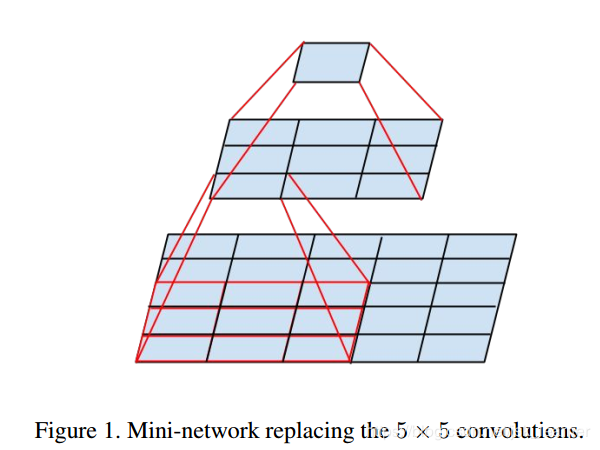

Therefore, we have developed a network that explores translation invariance and replaces one layer of convolution with two layers of convolution: the first layer is a 3x3 convolution layer and the second layer is a fully connected layer . Refer to Figure 1. We ended up replacing two 5x5 convolutional layers with two 3x3 convolutional layers. Refer to Figure 4 Figure 5. This operation can realize the weight sharing of neighboring layers. It is about (9 + 9) / 25 times reduction in computational consumption.

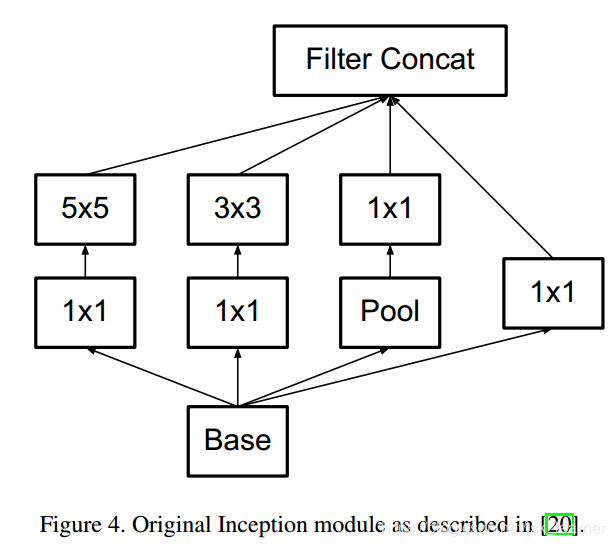

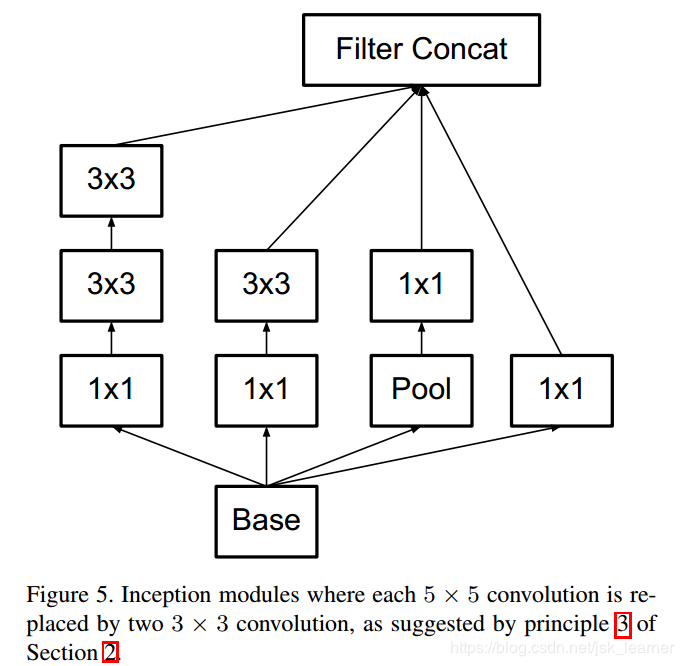

**Spatial Factorization into Asymmetric Convolutions**

We are wondering if the convolution kernel can be made smaller, such as 2x2, but there is an asymmetric method that can be better than this method. That is to use nx1 size convolution. For example, using the [3x1 + 1x3] convolution layer. In this case, a single 3x3 convolution has the same receptive field. Refer to Figure 3. This asymmetric method can save [((3x3)-(3 + 3)) / (3x3) = 33%] computing resources, and replacing two 2x2 only saves [11%] Computing resources.

In theory, we can have a deeper discussion and use the convolution of [1xn + nx1] instead of the convolutional layer of nxn. Refer to Figure 6. But this situation is not very good in the previous layer, but it can perform better on a medium-sized feature map [mxm, m is between 12 and 20]. In this case, use [1x7 + 7x1] convolutional layer can get a very good result.


**Utility of Auxiliary Classifiers**

Inception-v1 introduced some auxiliary classifiers (referring to some branches of the previous layer adding the softmax layer to calculate the loss back propagation) to improve the aggregation problem in deep networks. The original motive is to pass the gradient back to the previous convolutional layer , so that they can effectively and improve the aggregation of features and avoid the problem of vanishing gradients.

Traditionally, pooling layers are used in convolutional networks to reduce the size of feature maps . In order to avoid bottlenecks in the expression of spatial information, the number of convolution kernels in the network can be expanded before using max pooling or average pooling. 

For example, for a dxd network layer with K feature maps, to generate a network layer with 2K [d / 2 xd / 2] feature maps, we can use 2K convolution kernels with a step size of 1. Convolution and then add a pooling layer to get it, then this operation requires [2d 2 K 2 ]. But using pooling instead of convolution, the approximate operation is [2 * (d / 2) 2 xK 2 ], which reduces the operation by four times. However, this will cause a description bottleneck, because the feature map is reduced to [(d / 2) 2 xK], which will definitely cause the loss of spatial information on the network. Refer to Figure 9. However, we have adopted a different method to avoid this bottleneck, refer to Figure 10. That is, two parallel channels are used , one is a pooling layer (max or average), the step size is 2, and the other is a convolution layer , and then it is concatenated during output.

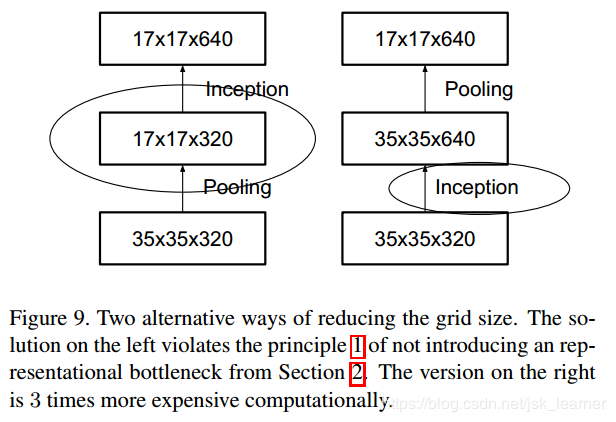

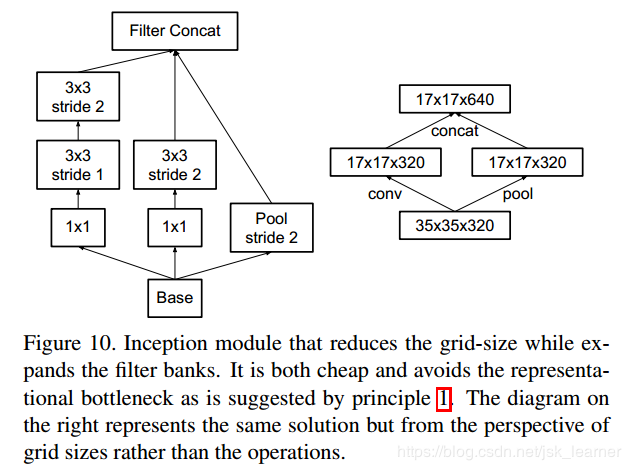

### Inception-v4-2016
After ResNet appeared, ResNet residual structure was added.

It is based on Inception-v3 and added the skip connection structure in ResNet. Finally, under the structure of 3 residual and 1 inception-v4 , it reached the top-5 error 3.08% in CLS (ImageNet calssification) .

1-Introduction
Residual conn works well when training very deep networks. Because the Inception network architecture can be very deep, it is reasonable to use residual conn instead of concat.

Compared with v3, Inception-v4 has more unified simplified structure and more inception modules.

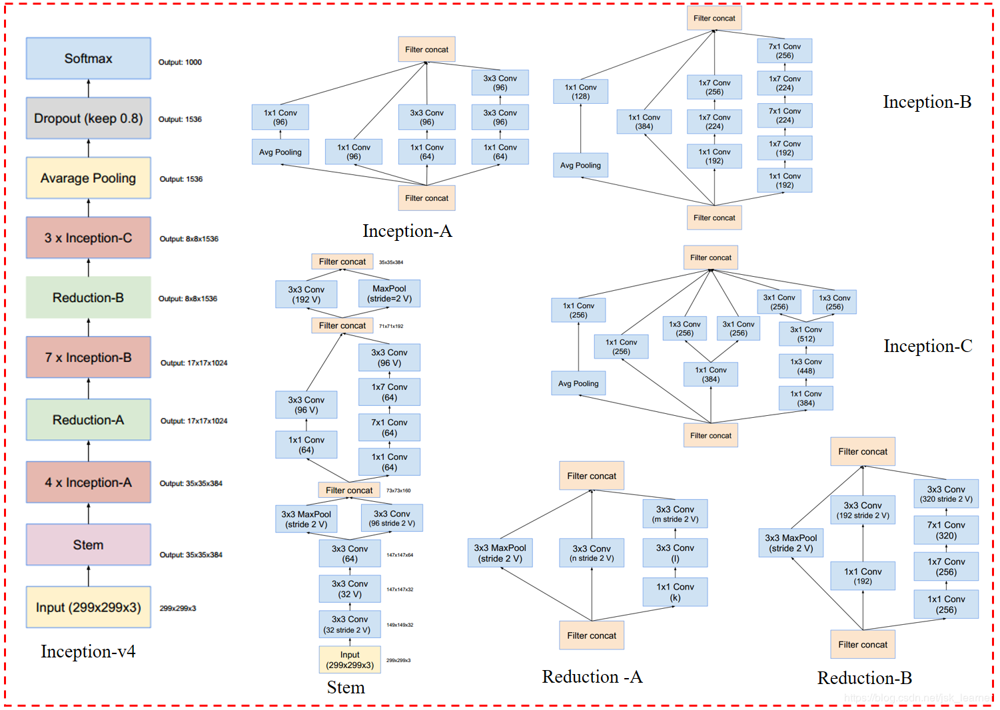

The big picture of Inception-v4:

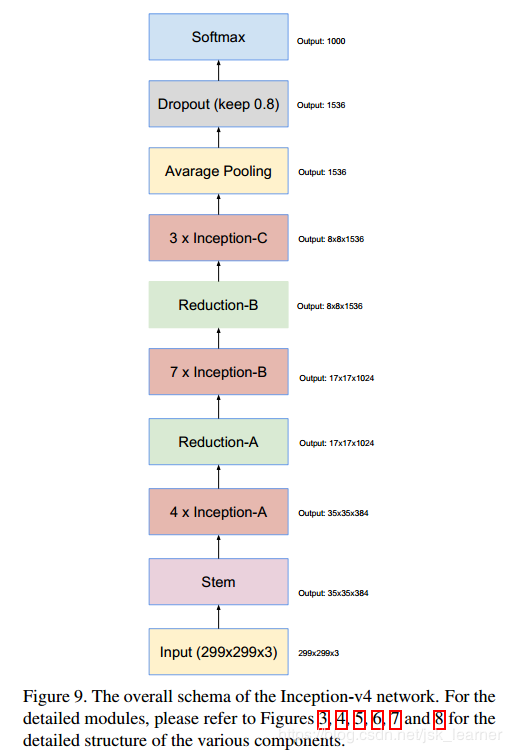

Fig9 is an overall picture, and Fig3,4,5,6,7,8 are all local structures. For the specific structure of each module, see the end of the article.

### Inception-v4-2016
After ResNet appeared, ResNet residual structure was added.

It is based on Inception-v3 and added the skip connection structure in ResNet. Finally, under the structure of 3 residual and 1 inception-v4 , it reached the top-5 error 3.08% in CLS (ImageNet calssification) .

1-Introduction
Residual conn works well when training very deep networks. Because the Inception network architecture can be very deep, it is reasonable to use residual conn instead of concat.

Compared with v3, Inception-v4 has more unified simplified structure and more inception modules.

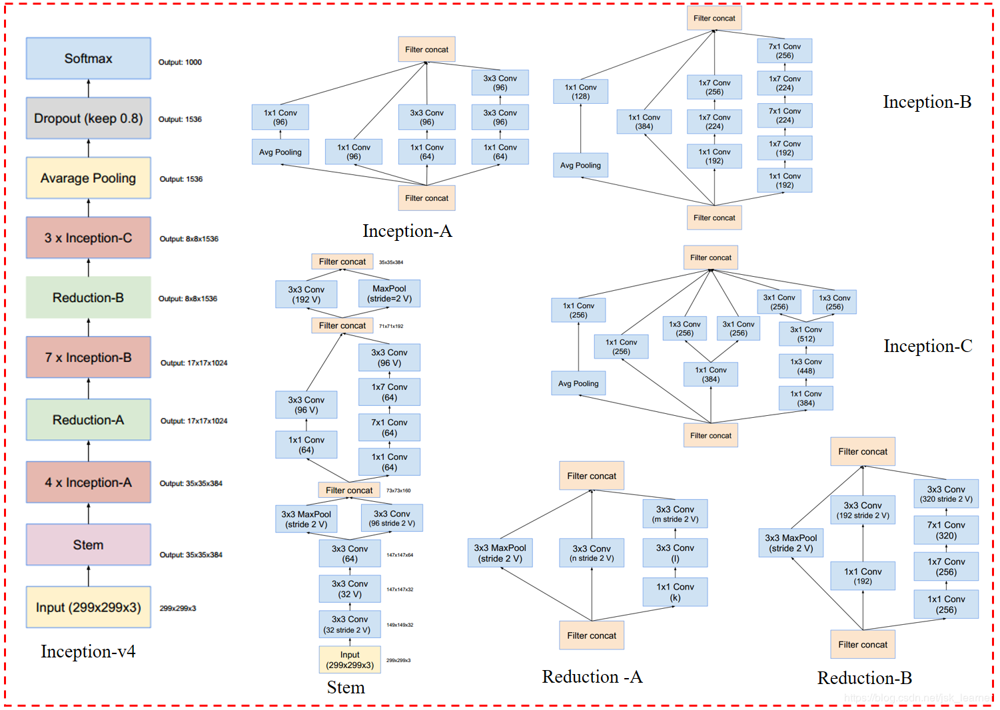

The big picture of Inception-v4:

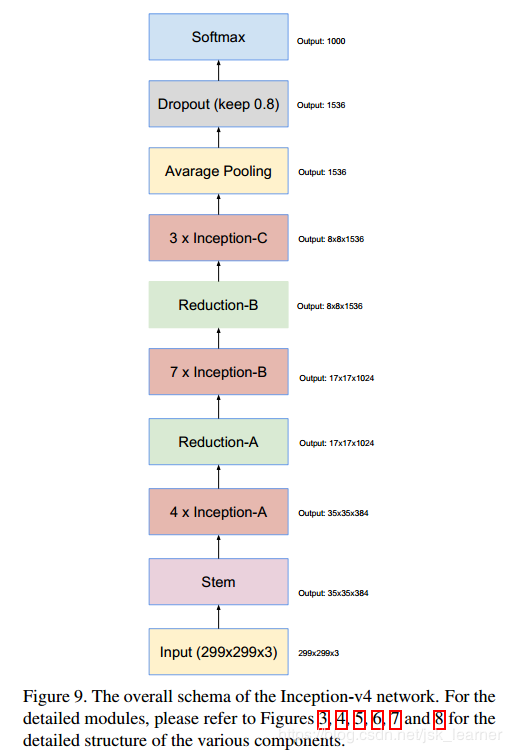

Fig9 is an overall picture, and Fig3,4,5,6,7,8 are all local structures. For the specific structure of each module, see the end of the article.

### Residual Inception Blocks

For the residual version in the Inception network, we use an Inception module that consumes less than the original Inception. The convolution kernel (followed by 1x1) of each Inception module is used to modify the dimension, which can compensate the reduction of the Inception dimension to some extent.


One is named **Inception-ResNet-v1**, which is consistent with the calculation cost of Inception-v3.
One is named **Inception-ResNet-v2**, which is consistent with the calculation cost of Inception-v4.

Figure 15 shows the structure of both. However, Inception-v4 is actually slower in practice, probably because it has more layers.

Another small technique is that we use the BN layer in the header of the traditional layer in the Inception-ResNet module, but not in the header of the summations. ** There is reason to believe that the BN layer is effective. But in order to add more Inception modules, we made a compromise between the two.

**Inception-ResNet-v1**

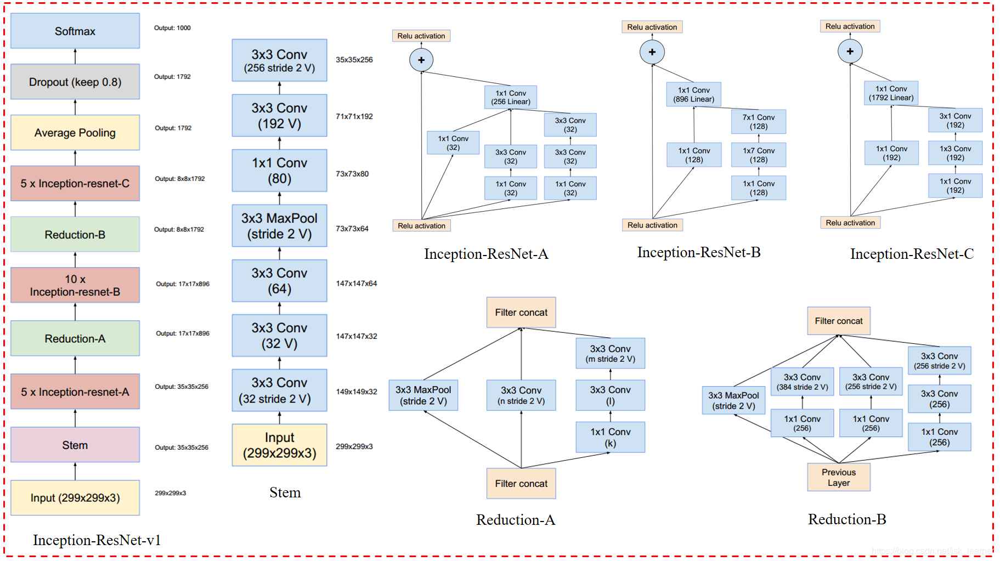

***Inception-ResNet-v2**

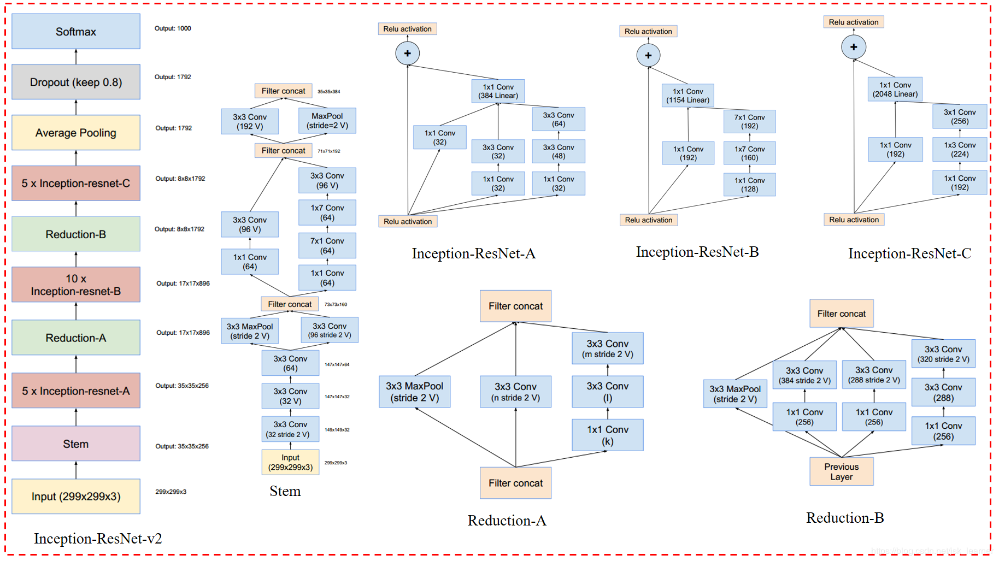

**Scaling of the Residuals**

This paper finds that when the number of convolution kernels exceeds 1,000 , the residual variants will start to show instability , and the network will die in the early stages of training, which means that the last layer before the average pooling layer is in the Very few iterations start with just a zero value . This situation cannot be prevented by reducing the learning rate or by adding a BN layer . Hekaiming's ResNet article also mentions this phenomenon.

This article finds that scale can stabilize the training process before adding the residual module to the activation layer . This article sets the scale coefficient between 0.1 and 0.3.

In order to prevent the occurrence of unstable training of deep residual networks, He suggested in the article that it is divided into two stages of training. The first stage is called warm-up (preheating) , that is, training the model with a very low learning first. In the second stage, a higher learning rate is used. And this article finds that if the convolution sum is very high, even a learning rate of 0.00001 cannot solve this training instability problem, and the high learning rate will also destroy the effect. But this article considers scale residuals to be more reliable than warm-up.

Even if scal is not strictly necessary, it has no effect on the final accuracy, but it can stabilize the training process.

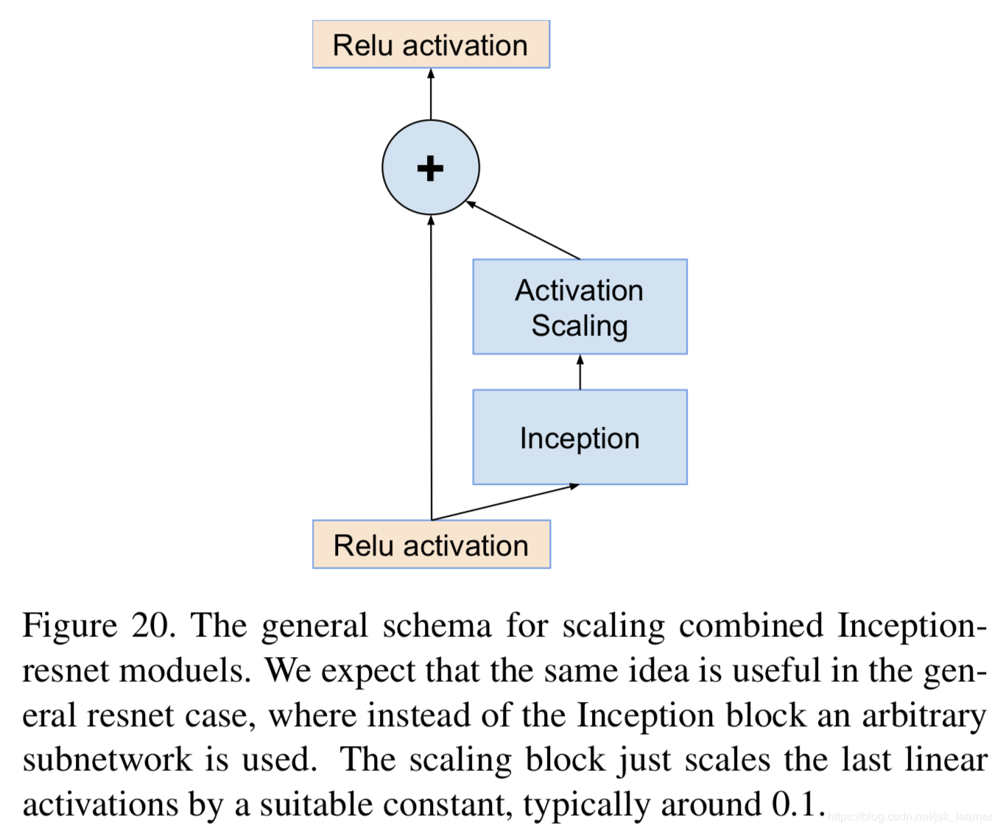

**Conclusion**

Inception-ResNet-v1 : a network architecture combining inception module and resnet module with similar calculation cost to Inception-v3;

Inception-ResNet-v2 : A more expensive but better performing network architecture.

Inception-v4 : A pure inception module, without residual connections, but with performance similar to Inception-ResNet-v2.


**A big picture of the various module structures of Inception-v4 / Inception-ResNet-v1 / v2:**

- Fig3-Stem: (Inception-v4 & Inception-ResNet-v2)

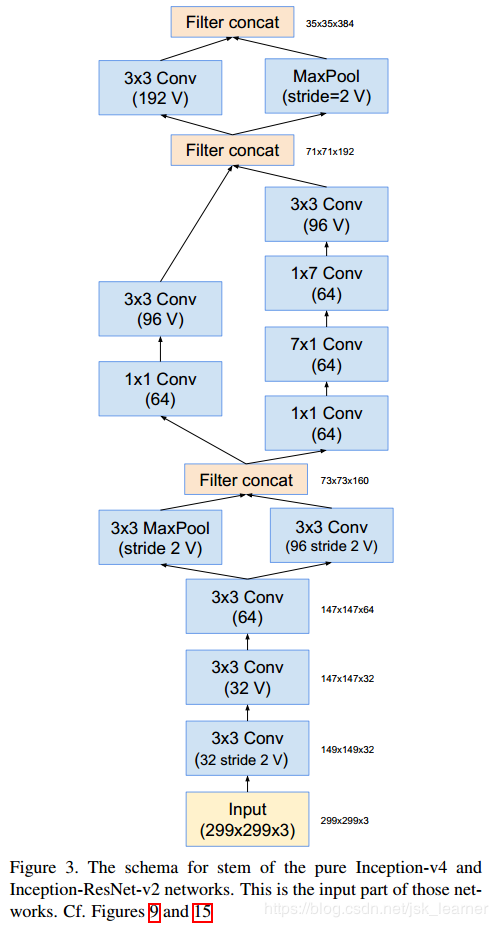

- Fig4-Inception-A: (Inception-v4)

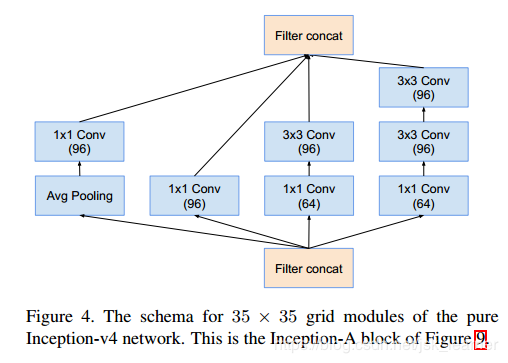

- Fig5-Inception-B: (Inception-v4)

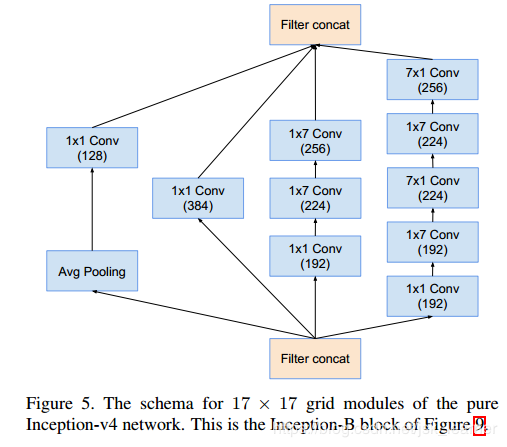

- Fig6-Inception-C: (Inception-v4)

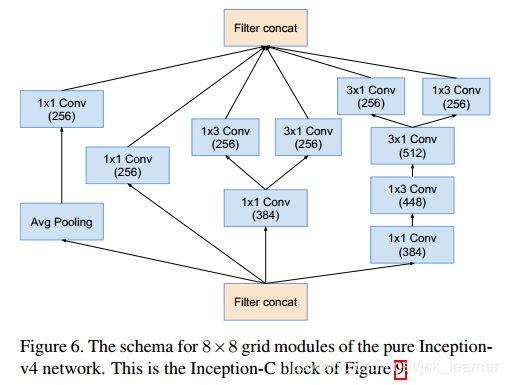

- Fig7-Reduction-A: (Inception-v4 & Inception-ResNet-v1 & Inception-ResNet-v2)

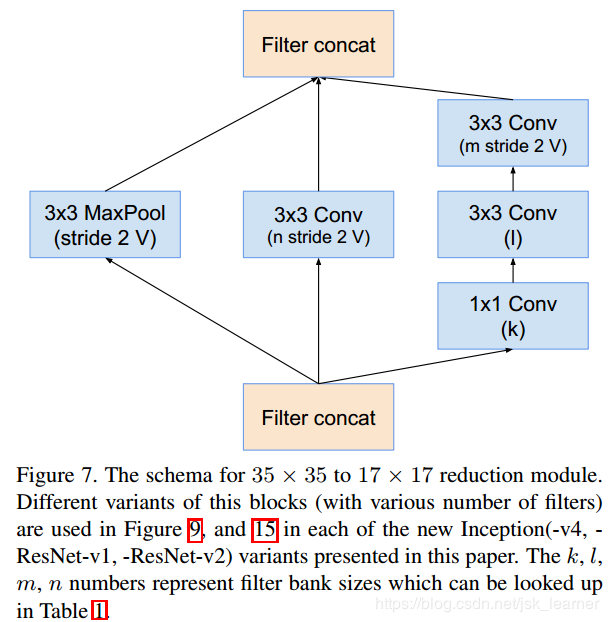

- Fig8-Reduction-B: (Inception-v4)

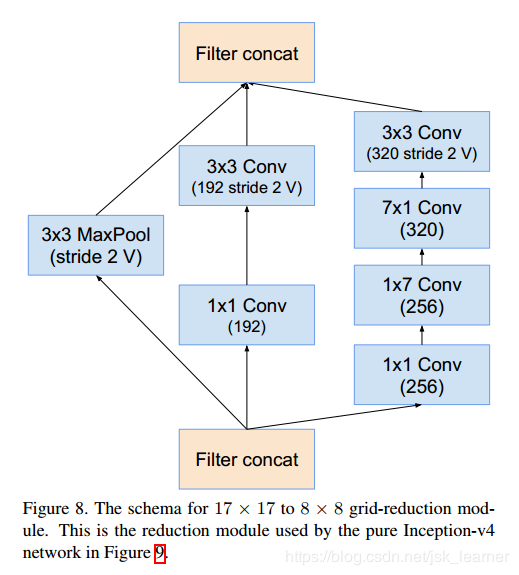

- Fig10-Inception-ResNet-A: (Inception-ResNet-v1)

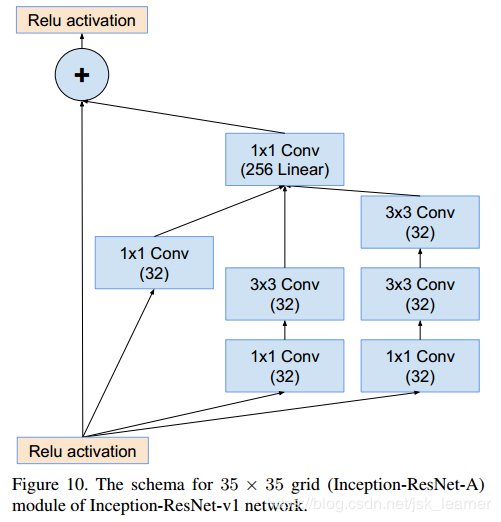

- Fig11-Inception-ResNet-B: (Inception-ResNet-v1)

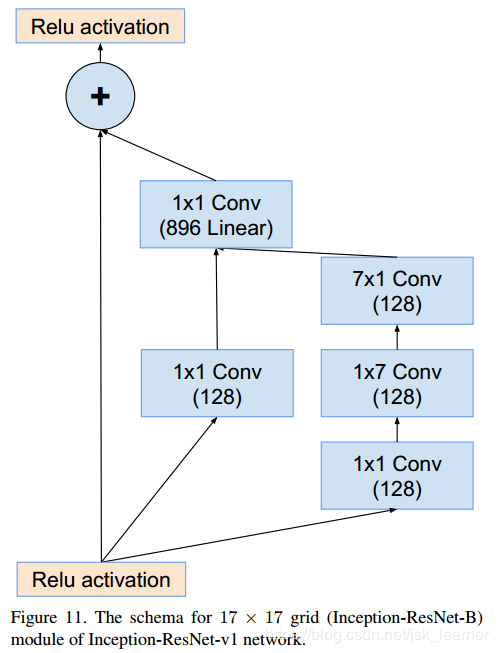

- Fig12-Reduction-B: (Inception-ResNet-v1)

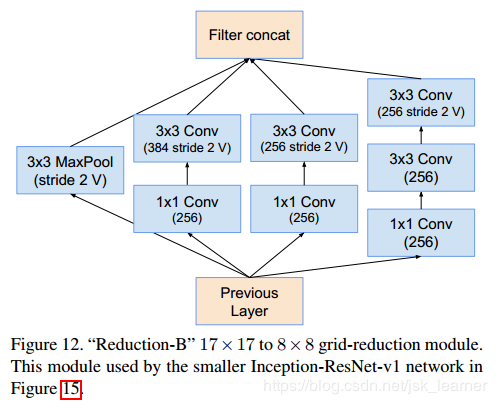

- Fig13-Inception-ResNet-C: (Inception-ResNet-v1)

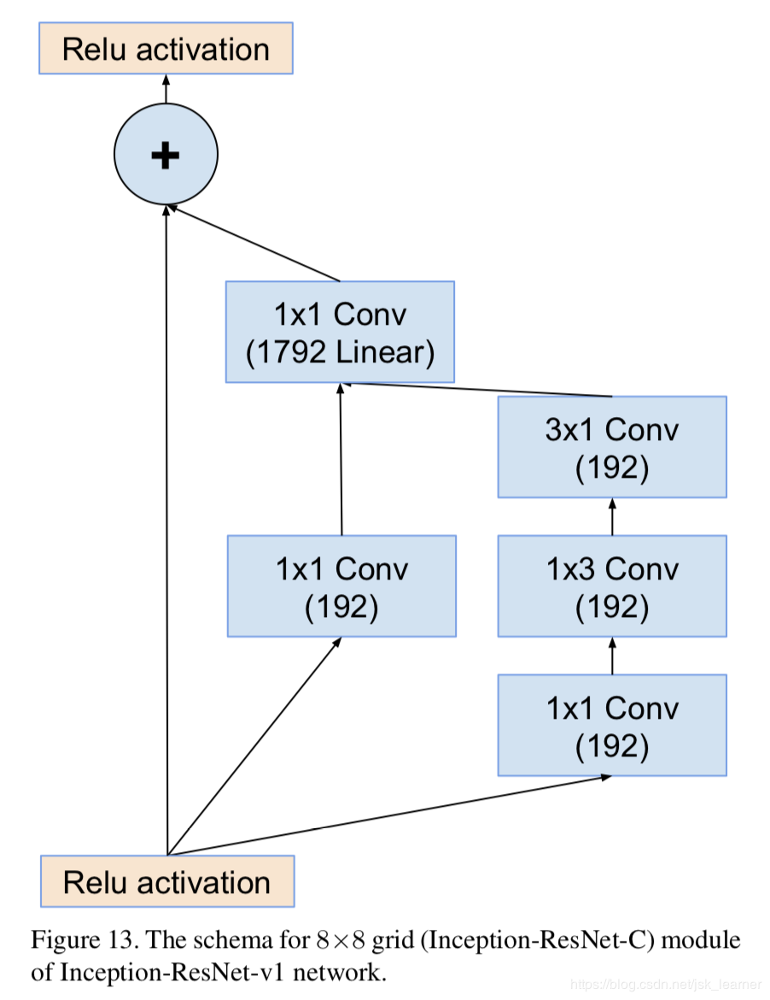

- Fig14-Stem: (Inception-ResNet-v1)

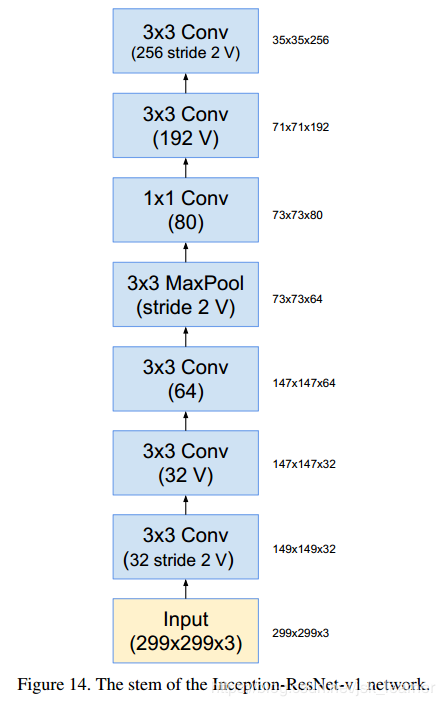

- Fig16-Inception-ResNet-A: (Inception-ResNet-v2)

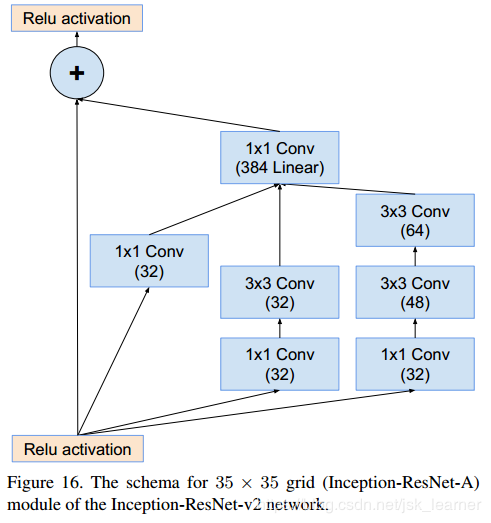

- Fig17-Inception-ResNet-B: (Inception-ResNet-v2)

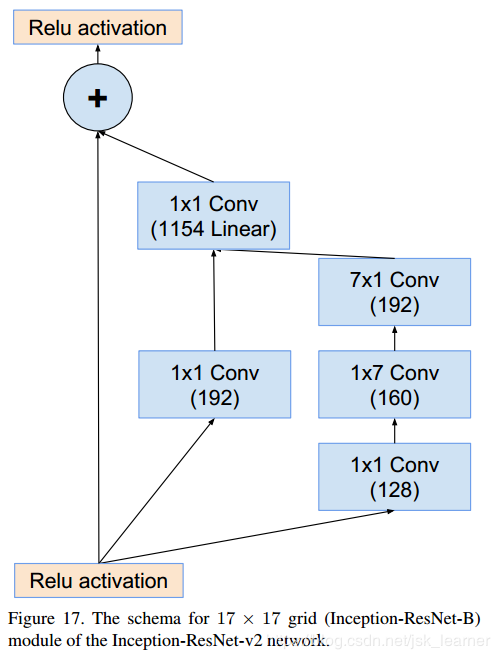

- Fig18-Reduction-B: (Inception-ResNet-v2)

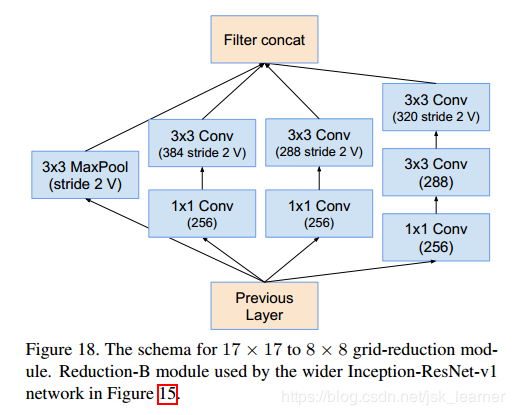

- Fig19-Inception-ResNet-C: (Inception-ResNet-v2)

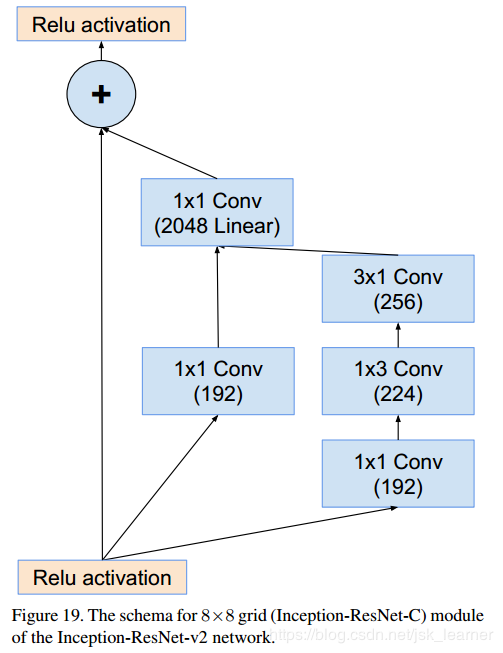

### Summary

* Inception v1 network, 1x1, 3x3, 5x5 conv and 3x3 pooling and stacking together, on the one hand, increase the width of the network, and on the other hand, increase the adaptability of the network to scale.


* The network of v2 has been improved based on v1. On the one hand, the BN layer has been added to reduce the internal covariate shift (the internal neuron's data distribution has changed), so that the output of each layer is normalized to an N (0, 1) Gaussian, on the other hand, learning VGG replaces 5x5 in the inception module with two 3x3 convs, which reduces the number of parameters and speeds up the calculation.


* One of the most important improvements in v3 is Factorization, which decomposes 7x7 into two one-dimensional convolutions (1x7, 7x1), and 3x3 is the same (1x3, 3x1). This benefit can speed up calculations (redundant calculations Capacity can be used to deepen the network), and one conv can be split into two convs, which further increases the network depth and increases the nonlinearity of the network. It is also worth noting that the network input has changed from 224x224 to 299x299, which is more refined. Designed 35x35 / 17x17 / 8x8 modules.


* v4 studied whether the Inception module combined with the Residual Connection can be improved? It was found that the structure of ResNet can greatly speed up training and improve performance at the same time. An Inception-ResNet v2 network was obtained. At the same time, a deeper and more optimized Inception v4 model was designed to achieve performance comparable to Inception-ResNet v2

### Code Implementation

In [3]:
import os
import zipfile
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
base_dir = 'tmp/cats_and_dogs_filtered'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=1e-4),
              metrics=['acc'])

# This code has changed. Now instead of the ImageGenerator just rescaling
# the image, we also rotate and do other operations
# Updated to do image augmentation
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        train_dir,  # This is the source directory for training images
        target_size=(150, 150),  # All images will be resized to 150x150
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

# Flow validation images in batches of 20 using test_datagen generator
validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

history = model.fit_generator(
      train_generator,
      steps_per_epoch=10,  # 2000 images = batch_size * steps
      epochs=10,
      validation_data=validation_generator,
      validation_steps=50,  # 1000 images = batch_size * steps
      verbose=2)

In [ ]:
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

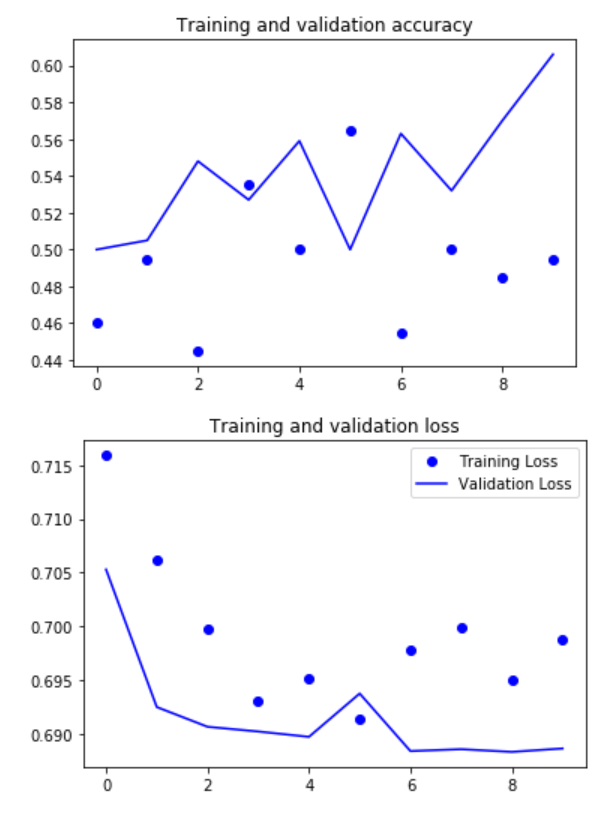

## ResNet

### Introduction

**ResNet is a network structure proposed by the He Kaiming, Sun Jian and others of Microsoft Research Asia in 2015, and won the first place in the ILSVRC-2015 classification task. At the same time, it won the first place in ImageNet detection, ImageNet localization, COCO detection, and COCO segmentation tasks. It was a sensation at the time.**

ResNet, also known as residual neural network, refers to the idea of ​​adding residual learning to the traditional convolutional neural network, which solves the problem of gradient dispersion and accuracy degradation (training set) in deep networks, so that the network can get more and more The deeper, both the accuracy and the speed are controlled.

>Deep Residual Learning for Image Recognition Original link : <a href="https://arxiv.org/pdf/1512.03385.pdf" target="_blank">ResNet Paper</a>

**The problem caused by increasing depth**

* The first problem brought by increasing depth is the problem of gradient explosion / dissipation . This is because as the number of layers increases, the gradient of backpropagation in the network will become unstable with continuous multiplication, and become particularly large or special. small. Among them , the problem of gradient dissipation often occurs .

* In order to overcome gradient dissipation, many solutions have been devised, such as using BatchNorm, replacing the activation function with ReLu, using Xaiver initialization, etc. It can be said that gradient dissipation has been well solved

* Another problem of increasing depth is the problem of network degradation, that is, as the depth increases, the performance of the network will become worse and worse, which is directly reflected in the decrease in accuracy on the training set. The residual network article solves this problem. And after this problem is solved, the depth of the network has increased by several orders of magnitude.

**Degradation of deep network**

>With network depth increasing, accuracy gets saturated (which might be unsurprising) and then degrades rapidly. Unexpectedly, such degradation is not caused by overfitting, and adding more layers to a favored deep model leads to higher training error.
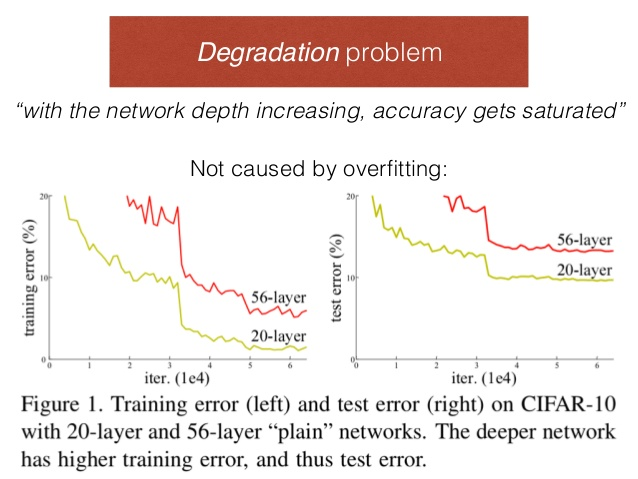

* The above figure is the error rate of the training set classified by the network on the CIFAR10-data set with the increase of the network depth . It can be seen that if we directly stack the convolutional layers, as the number of layers increases, the error rate increases significantly. The trend is that the deepest 56-layer network has the worst accuracy . We verified it on the VGG network. For the CIFAR-10 dataset, it took 5 minutes on the 18-layer VGG network to get the full network training. The 80% accuracy rate was achieved, and the 34-layer VGG model took 8 minutes to get the 72% accuracy rate. The problem of network degradation does exist.

* The decrease in the training set error rate indicates that the problem of degradation is not caused by overfitting. The specific reason is that it is left for further study. The author's other paper "Identity Mappings in Deep Residual Networks" proved the occurrence of degradation. It is because the optimization performance is not good, which indicates that the deeper the network, the more difficult the reverse gradient is to conduct.

### Deep Residual Networks

**From 10 to 100 layers**

We can imagine that *when we simply stack the network directly to a particularly long length, the internal characteristics of the network have reached the best situation in one of the layers. At this time, the remaining layers should not make any changes to the characteristics and learn automatically. The form of identity mapping*. That is to say, for a particularly deep deep network, the solution space of the shallow form of the network should be a subset of the solution space of the deep network, in other words, a network deeper than the shallow network will not have at least Worse effect, but this is not true because of network degradation.

Then, we settle for the second best. In the case of network degradation, if we do not add depth, we can improve the accuracy. Can we at least make the deep network achieve the same performance as the shallow network, that is, let the layers behind the deep network achieve at least The role of identity mapping . Based on this idea, the author proposes a residual module to help the network achieve identity mapping.

`To understand ResNet, we must first understand what kind of problems will occur when the network becomes deeper.` 

**The first problem brought by increasing the network depth is the disappearance and explosion of the gradient.**

This problem was successfully solved after Szegedy proposed the **BN (Batch Normalization)** structure. The BN layer can normalize the output of each layer. The size can still be kept stable after the reverse layer transfer, and it will not be too small or too large. 

**Is it easy to converge after adding BN and then increasing the depth?** 

The answer is still **negative**. The author mentioned the second problem-**the degradation problem**: when the level reaches a certain level, the accuracy will saturate and then decline rapidly. This decline is not caused by the disappearance of the gradient. It is not caused by overfit, but because the network is so complicated that it is difficult to achieve the ideal error rate by unconstrained stocking training alone. 

The degradation problem is not a problem of the network structure itself, but is caused by the current insufficient training methods. The currently widely used training methods, whether it is SGD, AdaGrad, or RMSProp, cannot reach the theoretically optimal convergence result after the network depth becomes larger. 

We can also prove that as long as there is an ideal training method, deeper networks will definitely perform better than shallow networks. 

*The proof process is also very simple*: `Suppose that several layers are added behind a network A to form a new network B. If the added level is just an identity mapping of the output of A, that is, the output of A is after the level of B becomes the output of B, there is no change, so the error rates of network A and network B are equal, which proves that the deepened network will not be worse than the network before deepening.`


He Kaiming proposed a residual structure to implement the above identity mapping (Below Figure): In addition to the normal convolution layer output, the entire module has a branch directly connecting the input to the output. The output and the output of the convolution do The final output is obtained by arithmetic addition. The formula is H (x) = F (x) + x, x is the input, F (x) is the output of the convolution branch, and H (x) is the output of the entire structure. It can be shown that if all parameters in the F (x) branch are 0, H (x) is an identity mapping. The residual structure artificially creates an identity map, which can make the entire structure converge in the direction of the identity map, ensuring that the final error rate will not become worse because the depth becomes larger. If a network can achieve the desired result by simply setting the parameter values by hand, then this structure can easily converge to the result through training. This is a rule that is unsuccessful when designing complex networks. Recall that in order to restore the original distribution after BN processing, the formula y = rx + delta is used. When r is manually set to standard deviation and delta is the mean, y is the distribution before BN processing. This is the use of this Rules.

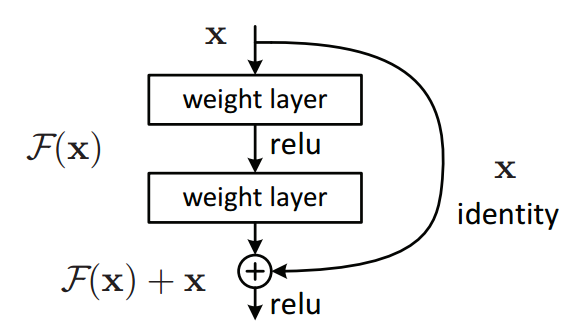

#### What does residual learning mean?

The idea of residual learning is the above picture, which can be understood as a block, defined as follows:

resnet11.gif

The residual learning block contains two branches or two mappings:

1. Identity mapping refers to the curved curve on the right side of the figure above. As its name implies, identity mapping refers to its own mapping, which is x itself;


2. *F*(x) Residual mapping refers to another branch, that is, part. This part is called residual mapping (y -x) .

**What role does the residual module play in back propagation?**

* The residual module will significantly reduce the parameter value in the module, so that the parameters in the network have a more sensitive response ability to the loss of reverse conduction, although the fundamental It does not solve the problem that the loss of backhaul is too small, but it reduces the parameters. Relatively speaking, it increases the effect of backhaul loss and also generates a certain regularization effect.

* Secondly, because there are branches of the identity mapping in the forward process, the gradient conduction in the back-propagation process also has more simple paths , and the gradient can be transmitted to the previous module after only one relu.

* The so-called backpropagation is that the network outputs a value, and then compares it with the real value to an error loss. At the same time, the loss is changed to change the parameter. The returned loss depends on the original loss and gradient. Since the purpose is to change the parameter, The problem is that if the intensity of changing the parameter is too small, the value of the parameter can be reduced, so that the loss of the intensity of changing the parameter is relatively greater.

* Therefore, the most important role of the residual module is to change the way of forward and backward information transmission, thereby greatly promoting the optimization of the network.

* Using the four criteria proposed by Inceptionv3, we will use them again to improve the residual module. Using criterion 3, the dimensionality reduction before spatial aggregation will not cause information loss, so the same method is also used here, adding 1 * 1 convolution The kernel is used to increase the non-linearity and reduce the depth of the output to reduce the computational cost. You get the form of a residual module that becomes a bottleneck. The figure above shows the basic form on the left and the bottleneck form on the right.

* To sum up, the shortcut module will help the features in the network perform identity mapping in the forward process, and help conduct gradients in the reverse process, so that deeper models can be successfully trained.


#### Why can the residual learning solve the problem of "the accuracy of the network deepening declines"?

For a neural network model, if the model is optimal, then training can easily optimize the residual mapping to 0, and only identity mapping is left at this time. No matter how you increase the depth, the network will always be in an optimal state in theory. Because it is equivalent to all the subsequent added networks to carry information transmission along the identity mapping (self), it can be understood that the number of layers behind the optimal network is discarded (without the ability to extract features), and it does not actually play a role. . In this way, the performance of the network will not decrease with increasing depth.


The author used two types of data, **ImageNet** and **CIFAR**, to prove the effectiveness of ResNet:

The first is ImageNet. The authors compared the training effect of ResNet structure and traditional structure with the same number of layers. The left side of Figure is a VGG-19 network with a traditional structure (each followed by BN), the middle is a 34-layer network with a traditional structure (each followed by BN), and the right side is 34 layers ResNet (the solid line indicates a direct connection, and the dashed line indicates a dimensional change using 1x1 convolution to match the number of features of the input and output). Figure 3 shows the results after training these types of networks. 


The data on the left shows that the 34-layer network (red line) with the traditional structure has a higher error rate than the VGG-19 (blue-green line). Because the BN structure is added to each layer Therefore, the high error is not caused by the gradient disappearing after the level is increased, but by the degradation problem; the ResNet structure on the right side of Figure 3 shows that the 34-layer network (red line) has a higher error rate than the 18-layer network (blue-green line). Low, this is because the ResNet structure has overcome the degradation problem. In addition, the final error rate of the ResNet 18-layer network on the right is similar to the error rate of the traditional 18-layer network on the left. This is because the 18-layer network is simpler and can converge to a more ideal result even without the ResNet structure.

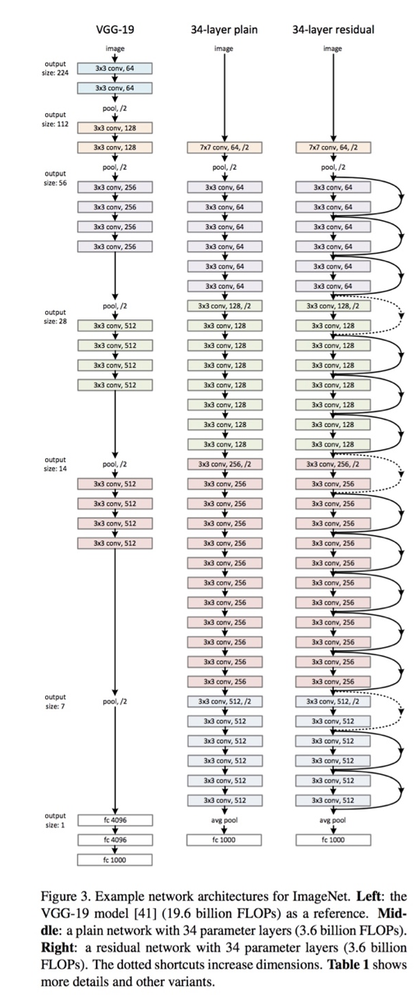

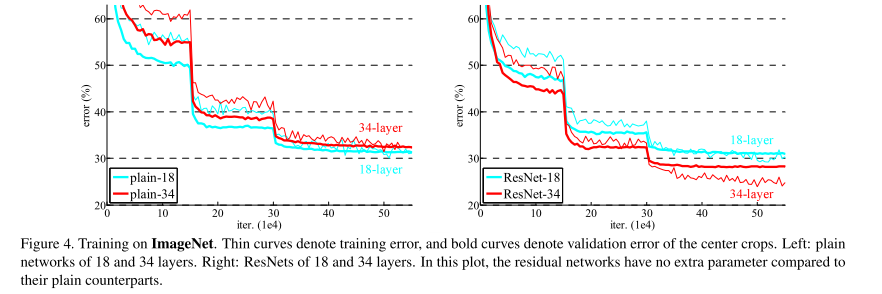

The ResNet structure like the left side of Fig. 4 is only used for shallow ResNet networks. If there are many network layers, the dimensions near the output end of the network will be very large. Still using the structure on the left side of Fig. 4 will cause a huge amount of calculation. For deeper networks, we all use the bottleneck structure on the right side of Figure 4, first using a 1x1 convolution for dimensionality reduction, then 3x3 convolution, and finally using 1x1 dimensionality to restore the original dimension.

In practice, considering the cost of the calculation, the residual block is calculated and optimized, that is, the two 3x3 convolution layers are replaced with 1x1 + 3x3 + 1x1 , as shown below. The middle 3x3 convolutional layer in the new structure first reduces the calculation under one dimensionality-reduced 1x1 convolutional layer , and then restores it under another 1x1 convolutional layer , both maintaining accuracy and reducing the amount of calculation .

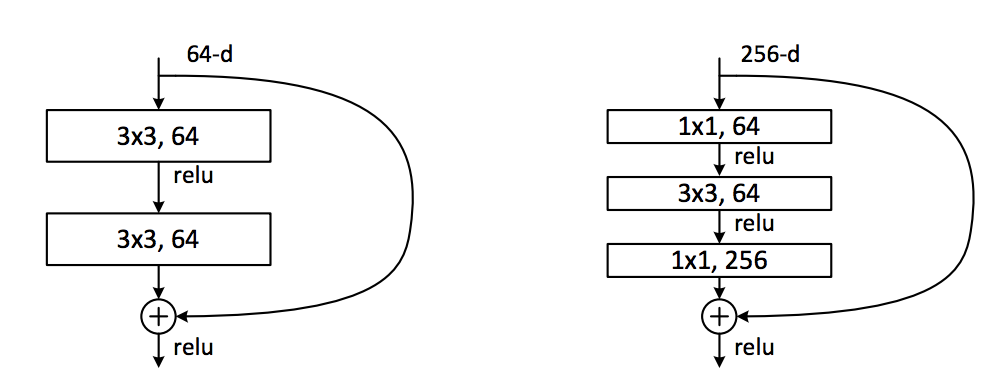


This is equivalent to reducing the amount of parameters for the same number of layers , so it can be extended to deeper models. So the author proposed ResNet with 50, 101 , and 152 layers , and not only did not have degradation problems, the error rate was greatly reduced, and the computational complexity was also kept at a very low level .

At this time, the error rate of ResNet has already dropped other networks a few streets, but it does not seem to be satisfied. Therefore, a more abnormal 1202 layer network has been built. For such a deep network, optimization is still not difficult, but it appears The problem of overfitting is quite normal. The author also said that the 1202 layer model will be further improved in the future.

**Diffrent Variants** : -

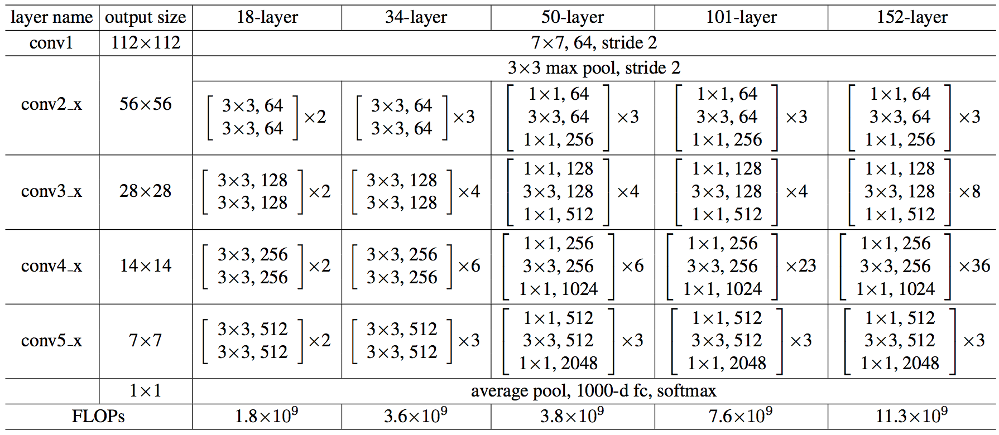

Below is the transcript of resnet, winning the championship at ImageNet2015

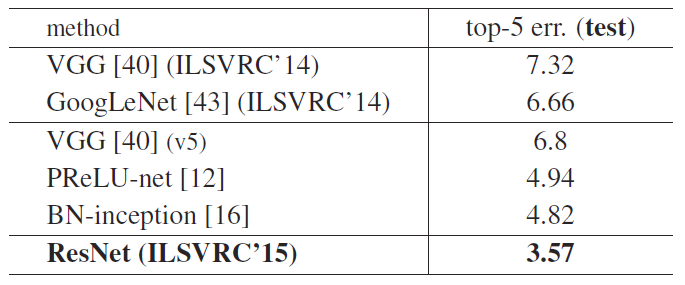

### Code implementation

In [17]:
from __future__ import print_function
import keras
from keras.layers import Dense, Conv2D, BatchNormalization, Activation
from keras.layers import AveragePooling2D, Input, Flatten
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator
from keras.regularizers import l2
from keras import backend as K
from keras.models import Model
from keras.datasets import cifar10
import numpy as np
import os

# Training parameters
batch_size = 32  # orig paper trained all networks with batch_size=128
epochs = 200
data_augmentation = True
num_classes = 10

# Subtracting pixel mean improves accuracy
subtract_pixel_mean = True

Using TensorFlow backend.


In [18]:
n = 3

# Model version
# Orig paper: version = 1 (ResNet v1), Improved ResNet: version = 2 (ResNet v2)
version = 1

# Computed depth from supplied model parameter n
if version == 1:
    depth = n * 6 + 2
elif version == 2:
    depth = n * 9 + 2

# Model name, depth and version
model_type = 'ResNet%dv%d' % (depth, version)

# Load the CIFAR10 data.
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Input image dimensions.
input_shape = x_train.shape[1:]

# Normalize data.
x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255

# If subtract pixel mean is enabled
if subtract_pixel_mean:
    x_train_mean = np.mean(x_train, axis=0)
    x_train -= x_train_mean
    x_test -= x_train_mean

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')
print('y_train shape:', y_train.shape)

# Convert class vectors to binary class matrices.
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples
y_train shape: (50000, 1)


In [19]:
def lr_schedule(epoch):
    """Learning Rate Schedule

    Learning rate is scheduled to be reduced after 80, 120, 160, 180 epochs.
    Called automatically every epoch as part of callbacks during training.

    # Arguments
        epoch (int): The number of epochs

    # Returns
        lr (float32): learning rate
    """
    lr = 1e-3
    if epoch > 180:
        lr *= 0.5e-3
    elif epoch > 160:
        lr *= 1e-3
    elif epoch > 120:
        lr *= 1e-2
    elif epoch > 80:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr

In [20]:
import tensorflow as tf
print(tf.__version__)
import tensorflow as tf
from tf.keras.applications import ResNet50
from tf.keras.models import Sequential

1.13.1


ModuleNotFoundError: No module named 'tf'

In [10]:
import tensorflow as tf

In [11]:
from tensorflow.python.keras.applications import ResNet50
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense

In [12]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline 

import cv2

import os

In [13]:
# Fixed for our Cats & Dogs classes
NUM_CLASSES = 2

# Fixed for Cats & Dogs color images
CHANNELS = 3

IMAGE_RESIZE = 224
RESNET50_POOLING_AVERAGE = 'avg'
DENSE_LAYER_ACTIVATION = 'softmax'
OBJECTIVE_FUNCTION = 'categorical_crossentropy'

# Common accuracy metric for all outputs, but can use different metrics for different output
LOSS_METRICS = ['accuracy']

# EARLY_STOP_PATIENCE must be < NUM_EPOCHS
NUM_EPOCHS = 10
EARLY_STOP_PATIENCE = 3

# These steps value should be proper FACTOR of no.-of-images in train & valid folders respectively
# Training images processed in each step would be no.-of-train-images / STEPS_PER_EPOCH_TRAINING
STEPS_PER_EPOCH_TRAINING = 10
STEPS_PER_EPOCH_VALIDATION = 10

# These steps value should be proper FACTOR of no.-of-images in train & valid folders respectively
# NOTE that these BATCH* are for Keras ImageDataGenerator batching to fill epoch step input
BATCH_SIZE_TRAINING = 100
BATCH_SIZE_VALIDATION = 100

# Using 1 to easily manage mapping between test_generator & prediction for submission preparation
BATCH_SIZE_TESTING = 1

In [14]:
resnet_weights_path = 'tmp/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'

In [ ]:
#model = ResNet50(include_top=False, weights='imagenet', input_tensor=Input(shape=(224,224,3)))


In [15]:
model = Sequential()

# 1st layer as the lumpsum weights from resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
# NOTE that this layer will be set below as NOT TRAINABLE, i.e., use it as is
model.add(ResNet50(include_top = False, pooling = RESNET50_POOLING_AVERAGE, weights = resnet_weights_path))

# 2nd layer as Dense for 2-class classification, i.e., dog or cat using SoftMax activation
model.add(Dense(NUM_CLASSES, activation = DENSE_LAYER_ACTIVATION))

# Say not to train first layer (ResNet) model as it is already trained
model.layers[0].trainable = False

ValueError: Shapes (1, 1, 128, 512) and (512, 256, 1, 1) are incompatible

In [1]:
import numpy as np


def get_random_eraser(p=0.5, s_l=0.02, s_h=0.4, r_1=0.3, r_2=1/0.3, v_l=0, v_h=255, pixel_level=False):
    def eraser(input_img):
        img_h, img_w, img_c = input_img.shape
        p_1 = np.random.rand()

        if p_1 > p:
            return input_img

        while True:
            s = np.random.uniform(s_l, s_h) * img_h * img_w
            r = np.random.uniform(r_1, r_2)
            w = int(np.sqrt(s / r))
            h = int(np.sqrt(s * r))
            left = np.random.randint(0, img_w)
            top = np.random.randint(0, img_h)

            if left + w <= img_w and top + h <= img_h:
                break

        if pixel_level:
            c = np.random.uniform(v_l, v_h, (h, w, img_c))
        else:
            c = np.random.uniform(v_l, v_h)

        input_img[top:top + h, left:left + w, :] = c

        return input_img

    return eraser

In [5]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
import tensorflow.keras as keras
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, UpSampling2D, Flatten, BatchNormalization, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras import optimizers
from keras.datasets import cifar100
import tensorflow as tf
from keras.utils import np_utils
import numpy as np
import matplotlib.pyplot as plt
import time
from skimage.transform import resize
from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.preprocessing.image import ImageDataGenerator

In [4]:
!pip install scikit-image

  Using cached https://files.pythonhosted.org/packages/41/8f/dd6a8e85946def36e4f2c69c84219af0fa5e832b018c970e92f2ad337e45/networkx-2.4-py3-none-any.whl


In [6]:
num_classes = 100
nb_epochs = 10

(x_train, y_train), (x_test, y_test) = cifar100.load_data()

#Pre-process the data
x_train = preprocess_input(x_train)
x_test = preprocess_input(x_test)

datagen = ImageDataGenerator(preprocessing_function=get_random_eraser(v_l=0, v_h=1, pixel_level=True))
datagen.fit(x_train)

In [7]:
y_train = np_utils.to_categorical(y_train, num_classes)
y_test = np_utils.to_categorical(y_test, num_classes)

In [8]:
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in resnet_model.layers:
    if isinstance(layer, BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False

model = Sequential()
model.add(UpSampling2D())
model.add(UpSampling2D())
model.add(UpSampling2D())
model.add(resnet_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
model.add(Dropout(.25))
model.add(BatchNormalization())
model.add(Dense(num_classes, activation='softmax'))

c:\users\soura\anaconda3\envs\tensor\lib\site-packages\keras_applications\resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '
W0210 14:33:10.933307 14612 deprecation.py:506] From c:\users\soura\anaconda3\envs\tensor\lib\site-packages\tensorflow\python\ops\init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [9]:
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

t=time.time()
historytemp = model.fit_generator(datagen.flow(x_train, y_train,
                                  batch_size=64),
                                  steps_per_epoch=x_train.shape[0] // 64,
                                  epochs=5,
                                  validation_data=(x_test, y_test))
print('Training time: %s' % (t - time.time()))

Epoch 1/5


ResourceExhaustedError: 2 root error(s) found.
  (0) Resource exhausted: OOM when allocating tensor with shape[64,256,64,64] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node Adam/gradients/AddN_162-1-TransposeNHWCToNCHW-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[metrics/acc/Identity/_2427]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

  (1) Resource exhausted: OOM when allocating tensor with shape[64,256,64,64] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node Adam/gradients/AddN_162-1-TransposeNHWCToNCHW-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

0 successful operations.
0 derived errors ignored.

In [ ]:
model.summary()

# Assignments 5

### Important Notes to follow for doing the assignmnets

1. Use Markdown to create your assignmnets. Use <a href="https://markdownmonster.west-wind.com/" target="_blank">Markdown_Monster</a> or <a href="https://typora.io/" target="_blank">Typora</a> to decorate your documents. 
2. There should be pictures attached to the needed documnets can be internet souce or self made.
3. Mention all the important formula and equations needed as per the topic
4. Upload all the assignments chapterwise/sectionwise.
5. Submit all your assignmnets before deadlines.
6. Write the answers below the specific questions.


## Chapter 5

**Question 1** Write the names of diffrent CNN architectures available till 2020?(Mininmum 10)

**Answer :** Here are ten popular Convolutional Neural Network (CNN) architectures that were available till 2020:
* **LeNet**
* **AlexNet**
* **VGG (Visual Geometry Group) Net**
* **GoogLeNet (Inception)**
* **ResNet (Residual Network)**
* **DenseNet**
* **MobileNet**
* **ShuffleNet**
* **EfficientNet**
* **NASNet (Neural Architecture Search Network)**

**Question 2** Diffrence b/w 3x3 and 5x5 kernels

**Answer  In the context of image processing and computer vision, a kernel refers to a small matrix used for image filtering, feature extraction, and other operations. The difference between 3x3 and 5x5 kernels lies in their size or dimension.

A 3x3 kernel is a matrix with three rows and three columns, resulting in nine elements. It is a commonly used kernel size in many image processing tasks such as edge detection, blurring, and sharpening. The use of a smaller kernel like a 3x3 can be advantageous in terms of computational efficiency as it requires less processing power than a larger kernel.

On the other hand, a 5x5 kernel is a matrix with five rows and five columns, resulting in twenty-five elements. It is a larger kernel size than 3x3 and is typically used for more complex image processing tasks that require more precise feature extraction. The use of a larger kernel like a 5x5 can provide better feature extraction and can be beneficial for more complex image processing tasks such as object detection and recognition.

In summary, the primary difference between 3x3 and 5x5 kernels is their size, with the latter providing more precise feature extraction but also requiring more computational resources. The choice of kernel size depends on the specific image processing task and the balance between accuracy and computational efficiency.

**Question 3** What are the cons of using Fully Connencted layers at the end of VGG architecture?

**Answer :** There are several cons or limitations of using fully connected layers at the end of the VGG architecture. Some of these are:

1. **High computational cost:** Fully connected layers have a large number of parameters that need to be trained, and they can quickly increase the computational cost of the model. This can make training and inference times longer, especially on large datasets.
2. **Overfitting:** Fully connected layers can be prone to overfitting, where the model becomes too specialized to the training data and performs poorly on new data. This is because they have a large number of parameters that can memorize the training data.
3. **Limited spatial information:** Fully connected layers do not take into account the spatial information of the input data. This is because they flatten the output of the convolutional layers into a one-dimensional vector before passing it to the fully connected layers. As a result, they can lose the spatial structure and context of the input data, which can be important for some tasks such as object detection and segmentation.
4. **Lack of scalability:** Fully connected layers are not scalable to input images of different sizes. This is because they have a fixed number of neurons that depend on the size of the input image. As a result, they cannot be easily adapted to different input sizes, which can limit the flexibility and generalization of the model.

To overcome these limitations, alternative architectures such as fully convolutional networks (FCNs) have been proposed that replace the fully connected layers with convolutional layers. FCNs can preserve spatial information, reduce overfitting, and be more computationally efficient, making them a better choice for some image processing tasks.

**Question 4** Write down the improvements in VGG over aleXnet?

**Answer :** The VGG (Visual Geometry Group) architecture was introduced in 2014 as an improvement over the previous state-of-the-art model, AlexNet. The key improvements of VGG over AlexNet are:

1. **Deeper architecture:** VGG is a deeper architecture than AlexNet, with up to 19 layers compared to AlexNet's 8 layers. This deeper architecture allows VGG to learn more complex features and patterns from the input images.
2. **Smaller filter size:** VGG uses smaller 3x3 filters compared to AlexNet's larger 11x11 filters. This allows VGG to capture more local features in the input images, which can be more useful for object recognition and classification.
3. **Uniform architecture:** VGG uses a uniform architecture of repeating convolutional and pooling layers followed by a few fully connected layers at the end. This uniformity allows for better parameter sharing and reduces the number of parameters needed to be trained, making the model more efficient.
4. **Pre-processing:** VGG used a standard pre-processing step that involved subtracting the mean RGB pixel value from each image. This pre-processing step helped to normalize the input data and improved the model's accuracy.
5. **Performance:** VGG achieved superior performance compared to AlexNet on the ImageNet dataset, with a top-5 error rate of 7.3% compared to AlexNet's 17.0% error rate.

Overall, the improvements made by VGG over AlexNet were crucial in advancing the state-of-the-art in image classification and object recognition, and laid the foundation for subsequent models such as ResNet and InceptionNet.

**Question 5** Explain the inception block in detail in GoogleNet.

**Answer :** The inception block is a key component of the GoogleNet architecture, which was introduced by Google in 2014 and won the ImageNet Large Scale Visual Recognition Challenge (ILSVRC) that year. The inception block is designed to enable the network to capture different scales and sizes of features from the input image while minimizing computational cost.

The inception block consists of multiple parallel convolutional layers that are concatenated at the end to form a single output. Specifically, the inception block contains four different types of operations:

1. **1x1 convolution layer:** This layer reduces the depth (number of channels) of the input feature map by applying 1x1 convolution with a small number of filters (e.g., 64 filters). This is done to reduce the number of parameters and computational cost of the model. The output of this layer is then fed into the subsequent convolutional layers.
2. **3x3 convolution layer:** This layer applies a 3x3 convolution to the input feature map with a large number of filters (e.g., 128 filters). The 3x3 convolution is chosen because it is a common size that captures both local and global features in the input image.
3. **5x5 convolution layer:** This layer applies a 5x5 convolution to the input feature map with a large number of filters (e.g., 32 filters). The 5x5 convolution is chosen to capture larger-scale features in the input image.
4. **Max pooling layer:** This layer performs max pooling with a 3x3 filter and a stride of 1. The max pooling layer is included to capture the most important features in the input image.

After applying these four operations to the input feature map, their outputs are concatenated along the depth dimension to form the final output of the inception block. This allows the network to capture features at multiple scales and sizes while minimizing the computational cost.

In addition, GoogleNet also includes an auxiliary classifier that is connected to some of the intermediate layers in the network. This auxiliary classifier is used to regularize the model during training and improve the gradient flow through the network, which can help prevent the vanishing gradient problem.

Overall, the inception block plays a crucial role in the GoogleNet architecture, allowing the network to capture features at multiple scales and sizes while minimizing the computational cost.

**Question 6** What are residual blocks?

**Answer :** Residual blocks are a type of building block used in deep neural networks, particularly in the ResNet (Residual Network) architecture. ResNet was introduced by Microsoft in 2015 and is a widely used architecture for image recognition tasks.

The idea behind residual blocks is to address the problem of vanishing gradients, which can occur when training very deep neural networks. As the gradients are propagated through multiple layers, they can become very small and cause the learning process to slow down or even stop. Residual blocks help to mitigate this problem by using skip connections to allow the gradients to flow more easily through the network.

A residual block typically consists of two or more convolutional layers with a skip connection that adds the original input to the output of the convolutional layers. The skip connection allows the input to bypass some of the layers in the block and flow directly to the output. The output of the residual block is then passed on to the next block in the network.

By adding the input to the output of the residual block, the network is able to learn residual mappings that capture the difference between the input and the output of the block. This allows the network to learn more easily and avoid the vanishing gradients problem, as the gradients can flow directly through the skip connection and bypass the convolutional layers in the block.

The use of residual blocks has been shown to improve the accuracy and convergence speed of deep neural networks, particularly on very deep architectures with hundreds of layers. ResNet, for example, achieved state-of-the-art results on the ImageNet dataset and other benchmark datasets, demonstrating the effectiveness of residual blocks in deep learning.

**Question 7** What are skip connections?

**Answer :** Skip connections, also known as shortcut connections or residual connections, are a way to connect the input of a neural network layer to its output without passing it through the layer's weights. Skip connections were introduced in the ResNet (Residual Network) architecture, which won the ImageNet Large Scale Visual Recognition Challenge (ILSVRC) in 2015 and has become a widely used architecture for image recognition tasks.

The purpose of skip connections is to help overcome the problem of vanishing gradients that can occur in very deep neural networks. When gradients are backpropagated through multiple layers, they can become very small, making it difficult to update the weights of the early layers in the network. Skip connections allow gradients to bypass some of the layers and flow directly to the output, making it easier for the network to learn.

There are two main types of skip connections:

1. **Identity skip connections:** In this type of skip connection, the input is simply added directly to the output of the layer. This is typically used when the input and output have the same shape and number of channels.

2. **Projection skip connections:** In this type of skip connection, the input is passed through a learnable projection layer (typically a 1x1 convolution) before being added to the output of the layer. This is used when the input and output have different shapes or number of channels.

Skip connections can be used in different parts of the network, including between convolutional layers, between residual blocks, or even between different branches of the network (as in the Inception architecture). By allowing gradients to flow more easily through the network, skip connections can improve the accuracy and convergence speed of deep neural networks, particularly on very deep architectures with hundreds of layers.

**Question 8** What are advantages of using skip connections?

**Answer :** kip connections offer several advantages when used in deep neural networks:

1. **Addressing vanishing gradients:** As neural networks get deeper, the gradients can become very small, making it difficult to update the weights of the early layers in the network. Skip connections allow gradients to bypass some of the layers and flow directly to the output, making it easier for the network to learn and addressing the problem of vanishing gradients.
2. **Improved accuracy:** Skip connections can improve the accuracy of deep neural networks, particularly on very deep architectures with hundreds of layers. By allowing gradients to flow more easily through the network, skip connections can help the network to learn more effectively and produce better results.
3. **Faster convergence:** Skip connections can also help to speed up the convergence of deep neural networks. By allowing gradients to flow more easily through the network, skip connections can reduce the number of iterations required for the network to converge to an optimal solution.
4. **Better generalization:** Skip connections can also help to improve the generalization ability of deep neural networks. By allowing the network to learn residual mappings, skip connections can help the network to generalize better to new, unseen data.
5. **More flexible architecture design:** Skip connections provide more flexibility in designing the architecture of deep neural networks. They allow different layers to be connected in different ways, making it easier to build complex networks that can learn more effectively.

Overall, skip connections are a powerful tool for improving the performance of deep neural networks and have been used successfully in many state-of-the-art architectures for image recognition, natural language processing, and other applications.